In [1]:
import psycopg2
import pandas as pd

In [ ]:
try:
    conn = psycopg2.connect(
    dbname = "dbweather",
    user = "postgres",
    password = "password",
    host = "localhost",
    port = "5432"
    )

    query = "select * from table_weather"
    weather_df = pd.read_sql_query(query, conn)
except Exception as e:
    print("Hata:", e)
finally:
    if conn:
        conn.close()
        print("Bağlantı kapatıldı")

Hata: connection to server at "localhost" (::1), port 5432 failed: Connection refused (0x0000274D/10061)
	Is the server running on that host and accepting TCP/IP connections?
connection to server at "localhost" (127.0.0.1), port 5432 failed: Connection refused (0x0000274D/10061)
	Is the server running on that host and accepting TCP/IP connections?



NameError: name 'conn' is not defined

In [ ]:
#EDA

In [3]:
weather_df.shape

(4909, 22)

In [4]:
weather_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4909 entries, 0 to 4908
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   id                    4909 non-null   int64         
 1   datetime              4909 non-null   datetime64[ns]
 2   data_type             4909 non-null   object        
 3   temperature           4725 non-null   float64       
 4   relative_humidity     4725 non-null   float64       
 5   apparent_temperature  4725 non-null   float64       
 6   precipitation         4725 non-null   float64       
 7   snowfall              3944 non-null   float64       
 8   weather_code          4725 non-null   float64       
 9   pressure              4725 non-null   float64       
 10  wind_speed            4725 non-null   float64       
 11  wind_direction        4725 non-null   float64       
 12  max_temperature       4813 non-null   float64       
 13  min_temperature   

In [5]:
print(weather_df.isnull().sum())

id                         0
datetime                   0
data_type                  0
temperature              184
relative_humidity        184
apparent_temperature     184
precipitation            184
snowfall                 965
weather_code             184
pressure                 184
wind_speed               184
wind_direction           184
max_temperature           96
min_temperature           96
mean_apparent_temp       877
precipitation_sum        973
snowfall_sum             973
sunrise                    0
sunset                     0
max_wind_speed           877
dominant_wind_dir        973
description             4128
dtype: int64


In [6]:
weather_df.describe().T

,count,mean,min,25%,50%,75%,max,std
id,4909.0,293256.567733,94495.0,134369.0,286517.0,438665.0,500075.0,146926.32712
datetime,4909,2024-10-10 16:32:06.035037696,2024-07-01 00:00:00,2024-08-21 03:00:00,2024-10-11 06:00:00,2024-12-01 09:00:00,2025-01-05 11:29:22,NaN
temperature,4725.0,17.696239,2.54,10.8,18.1,24.2,34.6,7.796448
relative_humidity,4725.0,74.301164,32.0,64.0,76.0,87.0,100.0,15.163269
apparent_temperature,4725.0,17.121456,-2.73,8.7,17.8,25.6,37.1,9.594117
precipitation,4725.0,0.077424,0.0,0.0,0.0,0.0,10.5,0.483624
snowfall,3944.0,0.000106,0.0,0.0,0.0,0.0,0.42,0.006688
weather_code,4725.0,133.835556,0.0,0.0,1.0,51.0,804.0,288.434971
pressure,4725.0,1013.445206,994.7,1006.8,1011.3,1020.0,1032.0,8.165156
wind_speed,4725.0,12.003496,0.3,6.9,10.7,16.6,38.0,6.692263


In [7]:
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
# SAYISAL DEĞİŞKENLERİN GÖRSELLEŞTİRİLMESİ

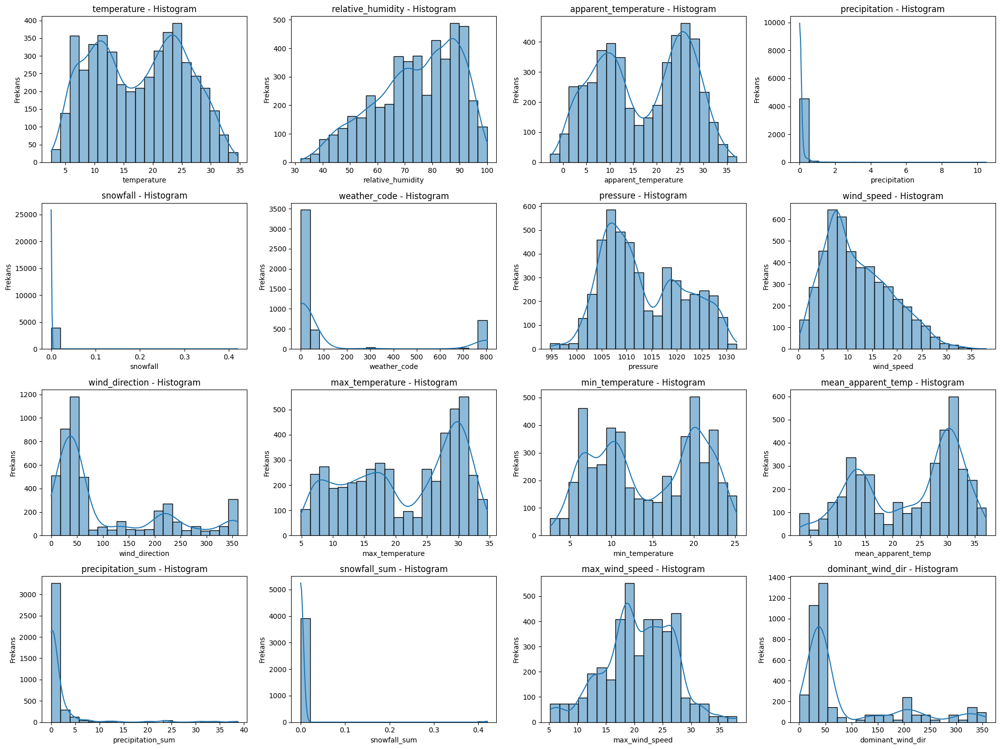

In [8]:
exclude_columns = ["id", "datetime", "data_type", "sunrise", "sunset", "description"]
numerical_columns = [col for col in weather_df.columns if col not in exclude_columns]

plt.figure(figsize=(20,15))
for i, col in enumerate(numerical_columns):
    plt.subplot(len(numerical_columns) // 4, 4, i+1)
    sns.histplot(weather_df[col], bins=20, kde=True)
    plt.xlabel(col)
    plt.ylabel("Frekans")
    plt.title(f"{col} - Histogram")
plt.tight_layout()
plt.show()

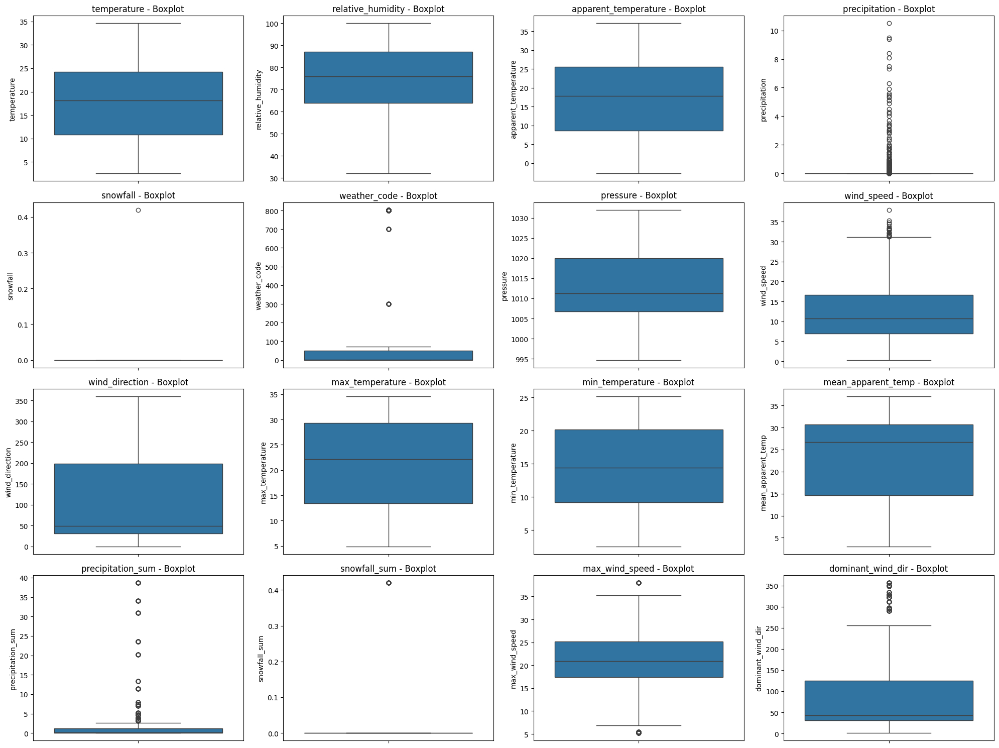

In [9]:
plt.figure(figsize=(20,15))
for i, col in enumerate(numerical_columns):
    plt.subplot(len(numerical_columns) // 4, 4, i+1)
    sns.boxplot(y=weather_df[col])
    plt.title(f"{col} - Boxplot")
    plt.ylabel(col)
plt.tight_layout()
plt.show()

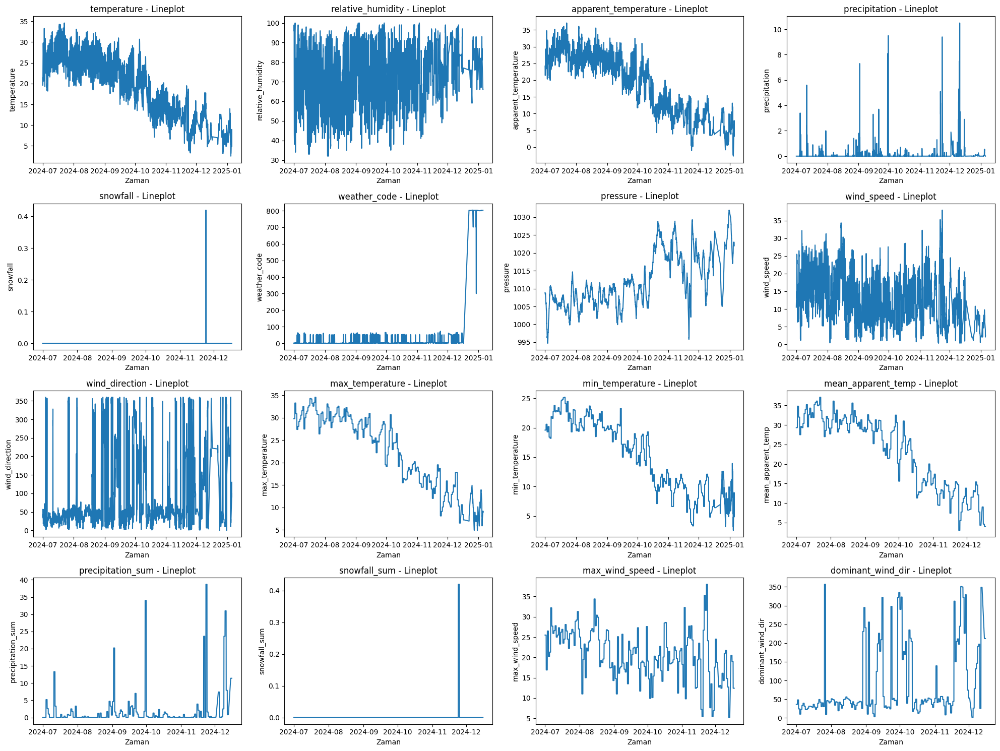

In [10]:
plt.figure(figsize=(20,15))
for i, col in enumerate(numerical_columns):
    plt.subplot(len(numerical_columns) // 4, 4, i+1)
    sns.lineplot(x=weather_df["datetime"]   , y=weather_df[col])
    plt.title(f"{col} - Lineplot")
    plt.xlabel("Zaman")
    plt.ylabel(col)
plt.tight_layout()
plt.show()

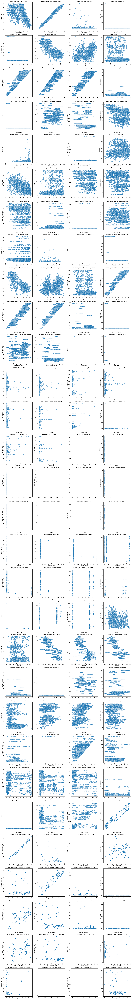

In [11]:
import math
n_pairs = len(numerical_columns) * (len(numerical_columns) - 1) // 2  # Tüm farklı çiftler

# Satır ve sütun sayısını belirle
n_columns = 4  # Bir satırda kaç grafik olacak
n_rows = math.ceil(n_pairs / n_columns)  # Satır sayısını hesapla

# Grafik boyutunu ayarla
fig, axes = plt.subplots(n_rows, n_columns, figsize=(n_columns * 5, n_rows * 5))
axes = axes.flatten()  # Matris düzenini düz bir listeye çevir

plot_idx = 0  # Subplot indeksi
for i, col1 in enumerate(numerical_columns):
    for col2 in numerical_columns[i + 1:]:
        if plot_idx < len(axes):  # Subplot alanına sığdığı sürece çiz
            sns.scatterplot(ax=axes[plot_idx], x=weather_df[col1], y=weather_df[col2], alpha=0.7)
            axes[plot_idx].set_title(f"{col1} vs {col2}")
            axes[plot_idx].set_xlabel(col1)
            axes[plot_idx].set_ylabel(col2)
            plot_idx += 1

# Boş kalan subplot alanlarını kaldır
for ax in axes[plot_idx:]:
    ax.remove()

plt.tight_layout()
plt.show()

In [ ]:
# KORELASYON

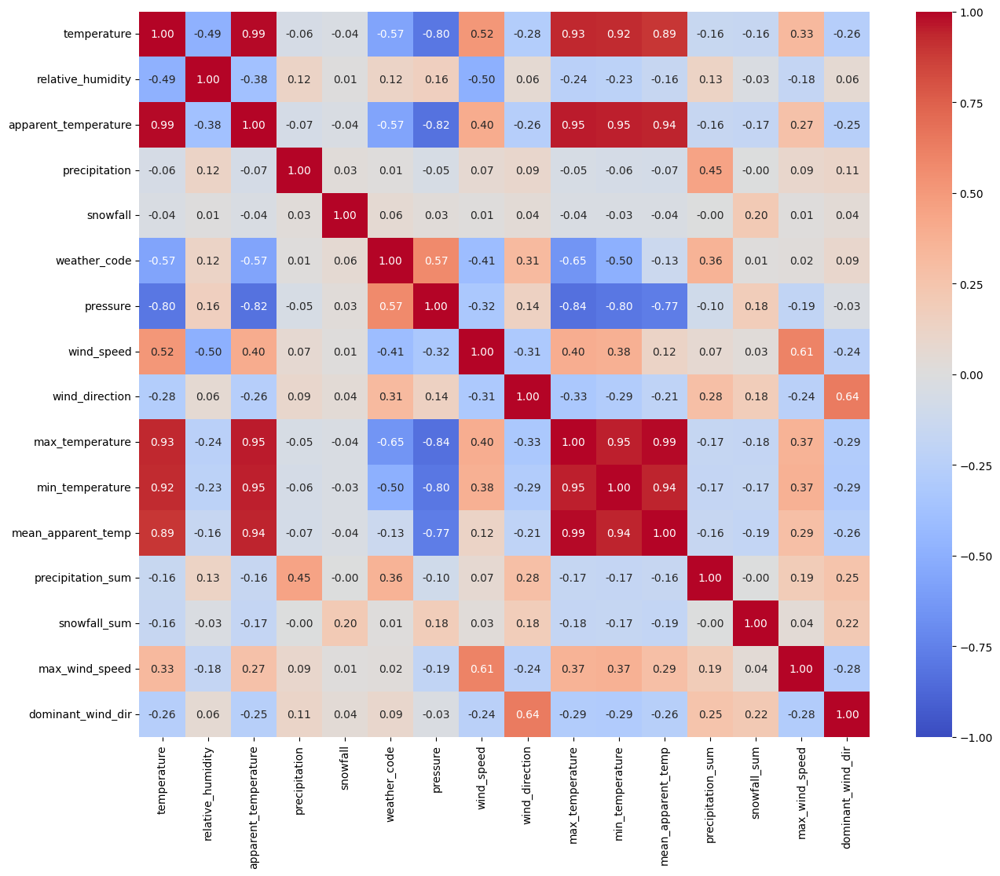

In [12]:
plt.figure(figsize=(15,12))
correlation = weather_df[numerical_columns].corr()
sns.heatmap(correlation, annot=True, cmap= "coolwarm", fmt=".2f", vmin=-1, vmax=1)
plt.show()

In [13]:
threshold = 0.70
high_corr_df = []

for i in range(len(correlation.columns)):
    for j in range(i):
        corr_value = correlation.iloc[i, j]
        if abs(corr_value) > threshold:
            col_variables1 = correlation.columns[i]
            col_variables2 = correlation.columns[j]
            high_corr_df.append((col_variables1, col_variables2, corr_value))

print("%70 üzeri yüksek korelasyona sahip olan değişken çiftleri:")
for col in high_corr_df:
    print(col)

%70 üzeri yüksek korelasyona sahip olan değişken çiftleri:
('apparent_temperature', 'temperature', 0.9867883683465002)
('pressure', 'temperature', -0.7997627978366606)
('pressure', 'apparent_temperature', -0.8226410738457991)
('max_temperature', 'temperature', 0.9322055216630376)
('max_temperature', 'apparent_temperature', 0.9543209357717162)
('max_temperature', 'pressure', -0.8358968452902517)
('min_temperature', 'temperature', 0.9237467936463105)
('min_temperature', 'apparent_temperature', 0.9493873908859006)
('min_temperature', 'pressure', -0.7994752638004438)
('min_temperature', 'max_temperature', 0.9458102387405992)
('mean_apparent_temp', 'temperature', 0.8925341971319044)
('mean_apparent_temp', 'apparent_temperature', 0.9432007395593532)
('mean_apparent_temp', 'pressure', -0.7711781433006601)
('mean_apparent_temp', 'max_temperature', 0.989180585007291)
('mean_apparent_temp', 'min_temperature', 0.9420352865813324)


In [ ]:
# SICAKLIK DEĞİŞKENLERİNİN GÖRSELLEŞTİRİLMESİ

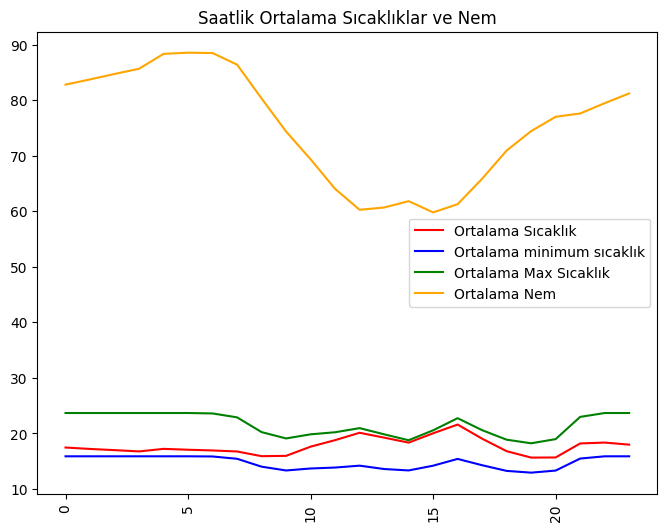

In [14]:
weather_df["hour"] = weather_df["datetime"].dt.hour
mean_temp_df = weather_df.groupby("hour")["temperature"].mean()
mean_min_df = weather_df.groupby("hour")["min_temperature"].mean()
mean_max_df = weather_df.groupby("hour")["max_temperature"].mean()
mean_humidity_df = weather_df.groupby("hour")["relative_humidity"].mean()
plt.figure(figsize=(8,6))
plt.plot(mean_temp_df, color="red", label="Ortalama Sıcaklık")
plt.plot(mean_min_df, color="blue", label="Ortalama minimum sıcaklık")
plt.plot(mean_max_df, color="green", label="Ortalama Max Sıcaklık")
plt.plot(mean_humidity_df, color="orange", label="Ortalama Nem")
plt.title("Saatlik Ortalama Sıcaklıklar ve Nem")
plt.xticks(rotation=90)
plt.legend()
plt.show()

C:\Users\BUSE\AppData\Local\Temp\ipykernel_5648\2942849415.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_time_of_day = weather_df.groupby("time_of_day")[["temperature", "relative_humidity"]].mean()


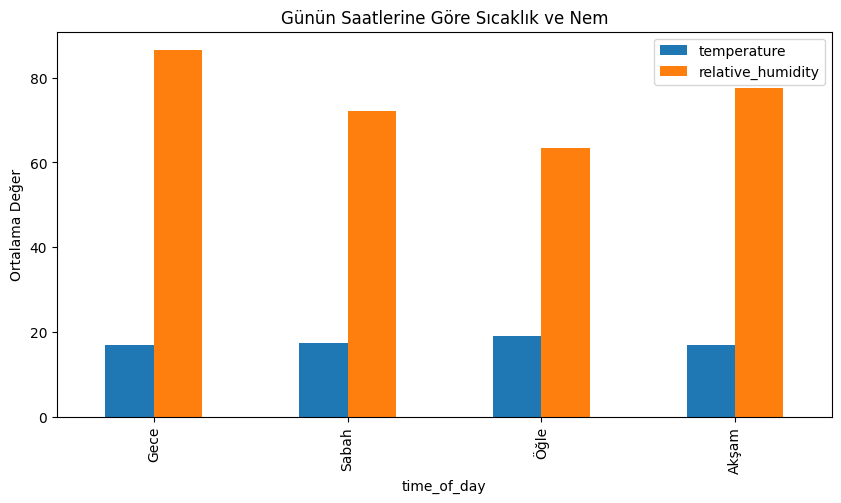

In [15]:
weather_df["time_of_day"] = pd.cut(weather_df["datetime"].dt.hour, bins=[0, 6, 12, 18, 24], labels=["Gece", "Sabah", "Öğle", "Akşam"])
mean_time_of_day = weather_df.groupby("time_of_day")[["temperature", "relative_humidity"]].mean()

mean_time_of_day.plot(kind="bar", figsize=(10,5))
plt.title("Günün Saatlerine Göre Sıcaklık ve Nem")
plt.ylabel("Ortalama Değer")
plt.show()

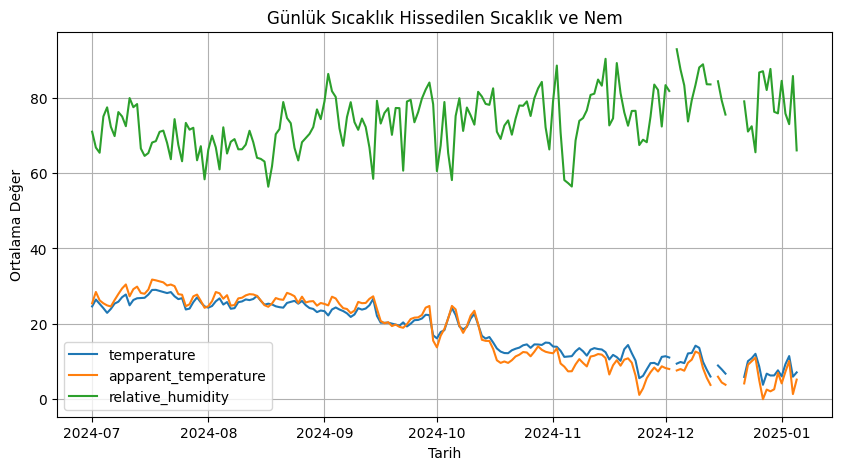

In [16]:
mean_daily = weather_df.groupby(weather_df["datetime"].dt.date)[["temperature", "apparent_temperature", "relative_humidity"]].mean()
mean_daily.plot(figsize=(10, 5))
plt.title("Günlük Sıcaklık Hissedilen Sıcaklık ve Nem")
plt.xlabel("Tarih")
plt.ylabel("Ortalama Değer")
plt.grid()
plt.show()

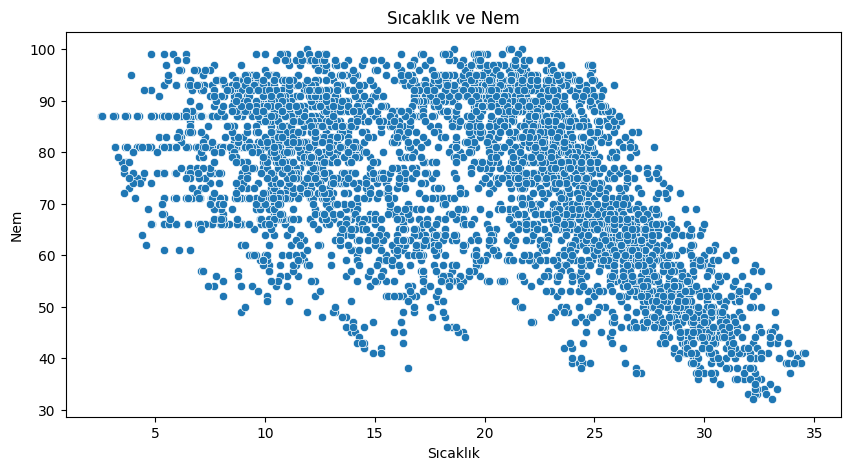

In [17]:
#Sıcaklık arttıkça nem oranının azalması gerekir. Soğuk havalarda nem oranın yüksek olması gerekir. Bu ilişki doğrusal değilse nedeni coğrafi,
#çevresel etkiler olabilir
plt.figure(figsize=(10, 5))
sns.scatterplot(weather_df, x="temperature", y="relative_humidity")
plt.title("Sıcaklık ve Nem")
plt.xlabel("Sıcaklık")
plt.ylabel("Nem")
plt.show()

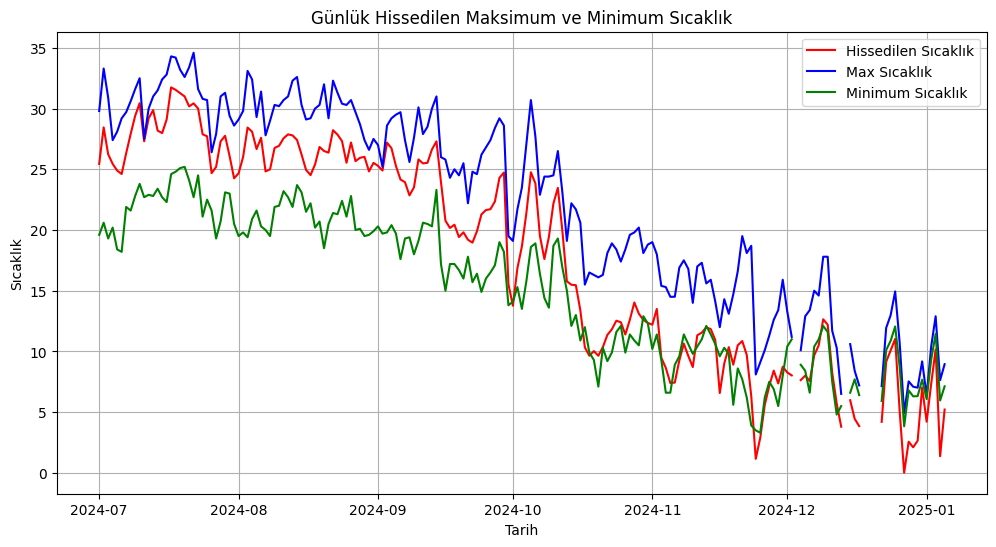

In [18]:
daily_filtered = weather_df.groupby(weather_df["datetime"].dt.date)[["apparent_temperature", "max_temperature", "min_temperature"]].mean()

plt.figure(figsize=(12, 6))
plt.plot(daily_filtered.index, daily_filtered["apparent_temperature"], label="Hissedilen Sıcaklık", color="red")
plt.plot(daily_filtered.index, daily_filtered["max_temperature"], label="Max Sıcaklık", color="blue")
plt.plot(daily_filtered.index, daily_filtered["min_temperature"], label="Minimum Sıcaklık", color="green")
plt.title("Günlük Hissedilen Maksimum ve Minimum Sıcaklık")
plt.xlabel("Tarih")
plt.ylabel("Sıcaklık")
plt.legend()
plt.grid()
plt.show()

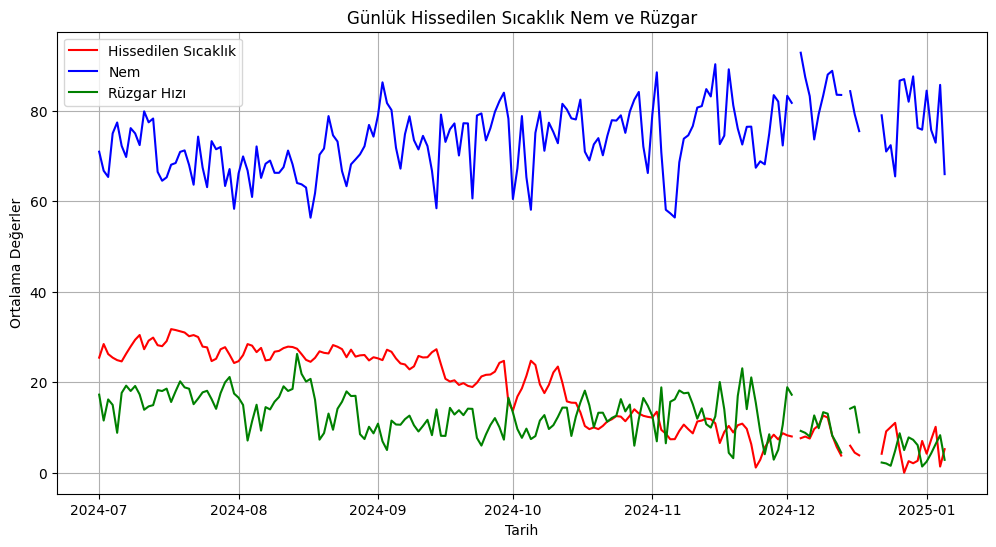

In [19]:
daily_filtered2 = weather_df.groupby(weather_df["datetime"].dt.date)[["apparent_temperature", "relative_humidity", "wind_speed"]].mean()

plt.figure(figsize=(12,6))
plt.plot(daily_filtered2.index, daily_filtered2["apparent_temperature"], label="Hissedilen Sıcaklık", color="red")
plt.plot(daily_filtered2.index, daily_filtered2["relative_humidity"], label="Nem", color="blue")
plt.plot(daily_filtered2.index, daily_filtered2["wind_speed"], label="Rüzgar Hızı", color="green")
plt.title(  "Günlük Hissedilen Sıcaklık Nem ve Rüzgar")
plt.xlabel("Tarih")
plt.ylabel("Ortalama Değerler")
plt.legend()
plt.grid()
plt.show()

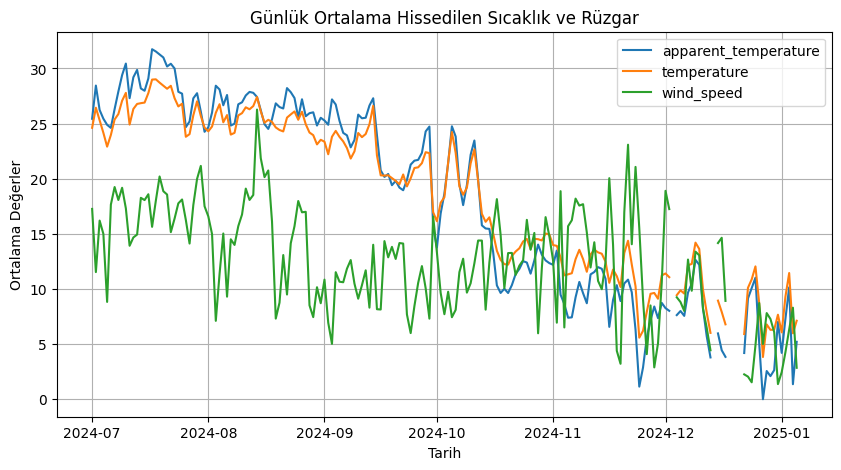

In [20]:
daily_wind_apparent = weather_df.groupby(weather_df["datetime"].dt.date)[["apparent_temperature", "temperature", "wind_speed"]].mean()

daily_wind_apparent.plot(figsize=(10,5))
plt.title("Günlük Ortalama Hissedilen Sıcaklık ve Rüzgar")
plt.xlabel("Tarih")
plt.ylabel("Ortalama Değerler")
plt.grid()
plt.show()

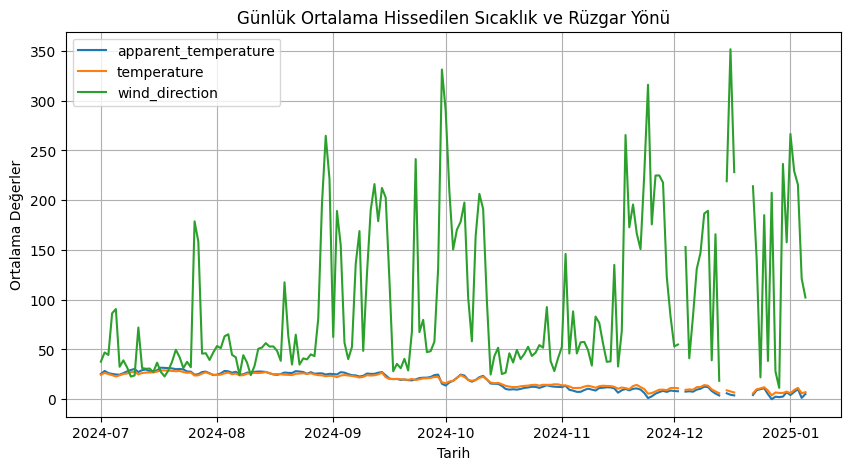

In [21]:
daily_wind_apparent = weather_df.groupby(weather_df["datetime"].dt.date)[["apparent_temperature", "temperature", "wind_direction"]].mean()

daily_wind_apparent.plot(figsize=(10,5))
plt.title("Günlük Ortalama Hissedilen Sıcaklık ve Rüzgar Yönü")
plt.xlabel("Tarih")
plt.ylabel("Ortalama Değerler")
plt.grid()
plt.show()

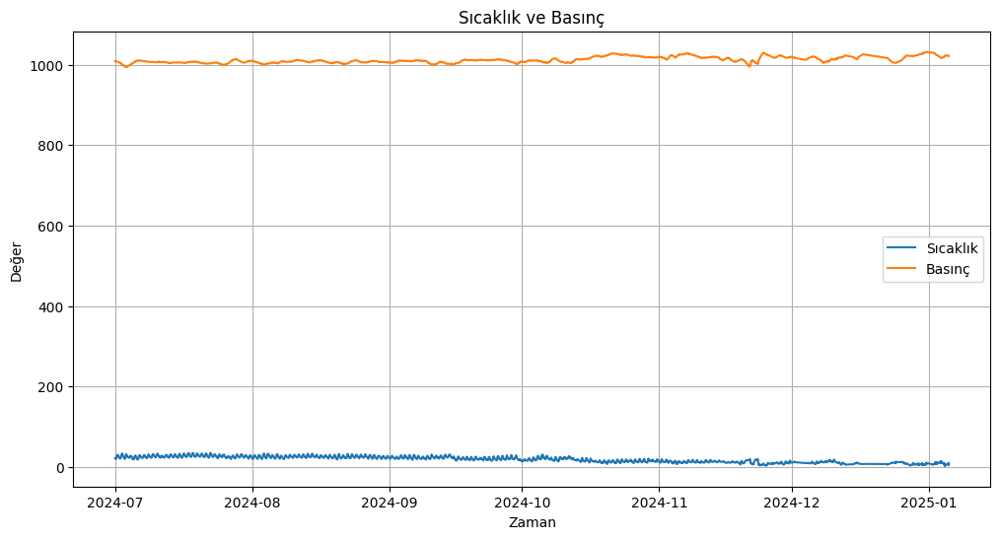

In [23]:
plt.figure(figsize=(12, 6))
sns.lineplot(weather_df, x="datetime", y="temperature", label="Sıcaklık")
sns.lineplot(weather_df, x="datetime", y="pressure", label="Basınç")
plt.title("Sıcaklık ve Basınç")
plt.xlabel("Zaman")
plt.ylabel("Değer")
plt.grid()
plt.show()

In [24]:
daily_filtered_df = weather_df.groupby(weather_df["datetime"].dt.date).agg({
    "temperature": ["mean", "max", "min"],
    "relative_humidity": "mean",
    "wind_speed": "mean",
    "precipitation": "sum"
}).reset_index()

daily_filtered_df.columns = ["Date", "Avg_Temperature", "Max_Temperature", "Min_Temperature", "Avg_Humidity", "Avg_Wind_Speed", "Total_Precipitation"]
daily_filtered_df.head(15)

,Date,Avg_Temperature,Max_Temperature,Min_Temperature,Avg_Humidity,Avg_Wind_Speed,Total_Precipitation
0,2024-07-01,24.620833,29.8,19.6,70.958333,17.266667,0.0
1,2024-07-02,26.441667,33.3,20.6,66.750000,11.537500,0.0
2,2024-07-03,25.320833,30.9,19.3,65.375000,16.208333,0.0
3,2024-07-04,24.166667,27.4,20.2,75.000000,15.004167,5.2
4,2024-07-05,22.912500,28.1,18.4,77.416667,8.833333,2.6
5,2024-07-06,23.970833,29.2,18.2,72.250000,17.654167,1.0
6,2024-07-07,25.375000,29.7,21.9,69.791667,19.250000,0.0
7,2024-07-08,25.866667,30.6,21.6,76.166667,18.075000,0.0
8,2024-07-09,27.075000,31.6,22.8,75.000000,19.183333,0.0
9,2024-07-10,27.787500,32.5,23.8,72.416667,17.316667,0.0


In [37]:
daily_filtered_df.iloc[0:31]

,Date,Avg_Temperature,Max_Temperature,Min_Temperature,Avg_Humidity,Avg_Wind_Speed,Total_Precipitation
0,2024-07-01,24.620833,29.8,19.6,70.958333,17.266667,0.0
1,2024-07-02,26.441667,33.3,20.6,66.750000,11.537500,0.0
2,2024-07-03,25.320833,30.9,19.3,65.375000,16.208333,0.0
3,2024-07-04,24.166667,27.4,20.2,75.000000,15.004167,5.2
4,2024-07-05,22.912500,28.1,18.4,77.416667,8.833333,2.6
5,2024-07-06,23.970833,29.2,18.2,72.250000,17.654167,1.0
6,2024-07-07,25.375000,29.7,21.9,69.791667,19.250000,0.0
7,2024-07-08,25.866667,30.6,21.6,76.166667,18.075000,0.0
8,2024-07-09,27.075000,31.6,22.8,75.000000,19.183333,0.0
9,2024-07-10,27.787500,32.5,23.8,72.416667,17.316667,0.0


In [38]:
daily_filtered_df.iloc[32:62]

,Date,Avg_Temperature,Max_Temperature,Min_Temperature,Avg_Humidity,Avg_Wind_Speed,Total_Precipitation
32,2024-08-02,24.737500,29.8,19.8,69.916667,14.983333,0.0
33,2024-08-03,25.979167,33.1,19.4,66.791667,7.116667,0.0
34,2024-08-04,26.758333,32.4,20.9,60.958333,11.362500,0.0
35,2024-08-05,25.120833,29.3,21.6,72.125000,15.037500,0.2
36,2024-08-06,25.775000,31.4,20.3,65.166667,9.308333,0.0
37,2024-08-07,24.004167,27.8,20.0,68.291667,14.512500,0.4
38,2024-08-08,24.162500,29.0,19.5,69.000000,14.000000,0.1
39,2024-08-09,25.745833,30.3,21.9,66.291667,15.704167,0.1
40,2024-08-10,25.950000,30.2,22.0,66.291667,16.758333,0.2
41,2024-08-11,26.479167,30.7,23.2,67.541667,19.108333,0.0


In [63]:
daily_filtered_df.iloc[154:182]

,Date,Avg_Temperature,Max_Temperature,Min_Temperature,Avg_Humidity,Avg_Wind_Speed,Total_Precipitation
154,2024-12-02,11.075000,11.20,11.00,81.750000,17.250000,1.90
155,2024-12-03,NaN,NaN,NaN,NaN,NaN,0.00
156,2024-12-04,9.445833,10.10,8.90,92.833333,9.254167,7.40
157,2024-12-05,9.883333,12.90,8.40,87.458333,8.820833,0.10
158,2024-12-06,9.587500,13.40,6.60,83.250000,8.012500,0.00
159,2024-12-07,12.154167,15.00,10.40,73.666667,12.675000,0.20
160,2024-12-08,12.279167,14.60,11.00,79.291667,9.845833,2.50
161,2024-12-09,14.208333,17.80,12.10,83.375000,13.391667,23.60
162,2024-12-10,13.637500,17.80,11.60,88.000000,13.058333,31.00
163,2024-12-11,9.941667,11.70,7.50,88.833333,8.225000,7.90


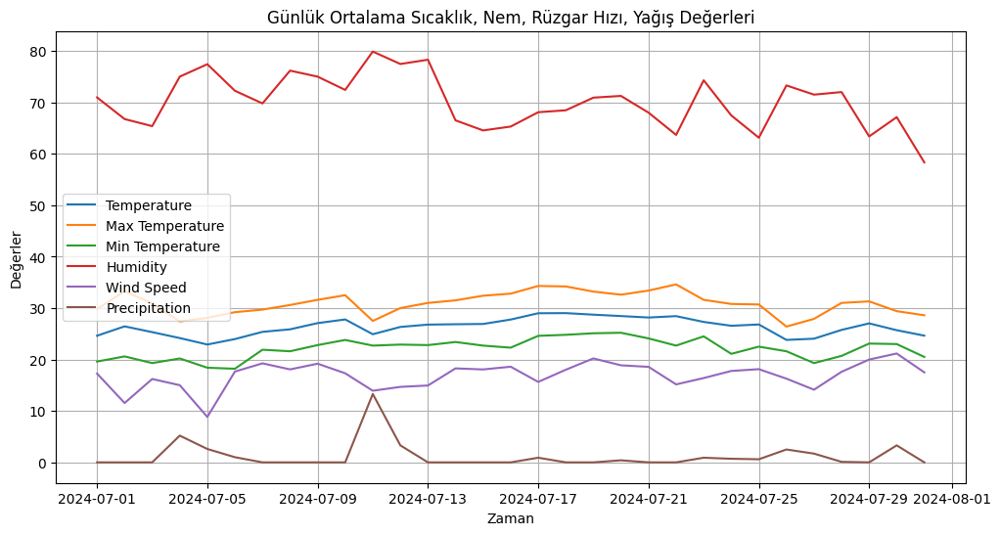

In [25]:
# TEMMUZ AYI
plt.figure(figsize=(12, 6))
sns.lineplot(daily_filtered_df.iloc[0:31], x="Date", y="Avg_Temperature", label="Temperature")
sns.lineplot(daily_filtered_df.iloc[0:31], x="Date", y="Max_Temperature", label="Max Temperature")
sns.lineplot(daily_filtered_df.iloc[0:31], x="Date", y="Min_Temperature", label="Min Temperature")
sns.lineplot(daily_filtered_df.iloc[0:31], x="Date", y="Avg_Humidity", label="Humidity")
sns.lineplot(daily_filtered_df.iloc[0:31], x="Date", y="Avg_Wind_Speed", label="Wind Speed")
sns.lineplot(daily_filtered_df.iloc[0:31], x="Date", y="Total_Precipitation", label="Precipitation")
plt.title("Günlük Ortalama Sıcaklık, Nem, Rüzgar Hızı, Yağış Değerleri")
plt.xlabel("Zaman")
plt.ylabel("Değerler")
plt.grid()
plt.show()

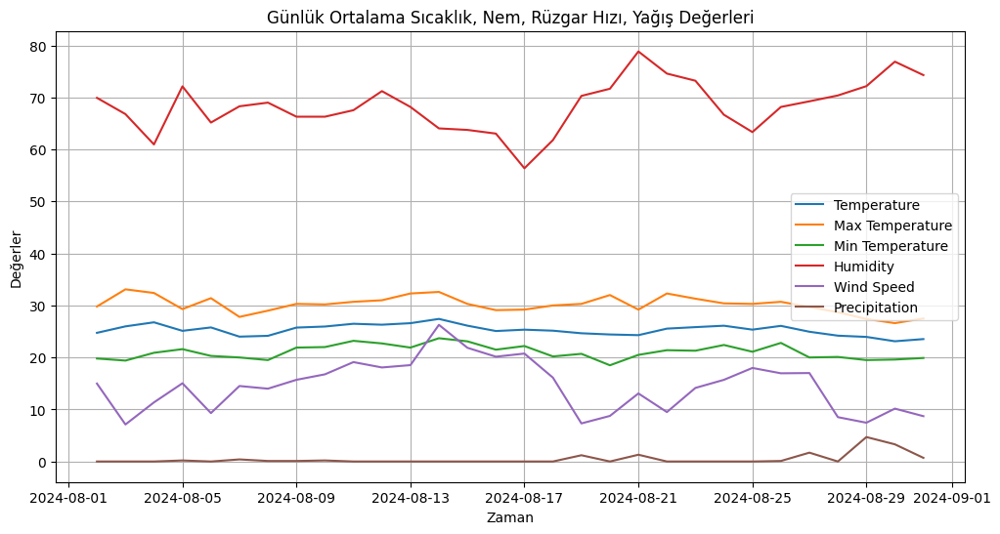

In [26]:
# AĞUSTOS AYI
plt.figure(figsize=(12, 6))
sns.lineplot(daily_filtered_df.iloc[32:62], x="Date", y="Avg_Temperature", label="Temperature")
sns.lineplot(daily_filtered_df.iloc[32:62], x="Date", y="Max_Temperature", label="Max Temperature")
sns.lineplot(daily_filtered_df.iloc[32:62], x="Date", y="Min_Temperature", label="Min Temperature")
sns.lineplot(daily_filtered_df.iloc[32:62], x="Date", y="Avg_Humidity", label="Humidity")
sns.lineplot(daily_filtered_df.iloc[32:62], x="Date", y="Avg_Wind_Speed", label="Wind Speed")
sns.lineplot(daily_filtered_df.iloc[32:62], x="Date", y="Total_Precipitation", label="Precipitation")
plt.title("Günlük Ortalama Sıcaklık, Nem, Rüzgar Hızı, Yağış Değerleri")
plt.xlabel("Zaman")
plt.ylabel("Değerler")
plt.grid()
plt.show()

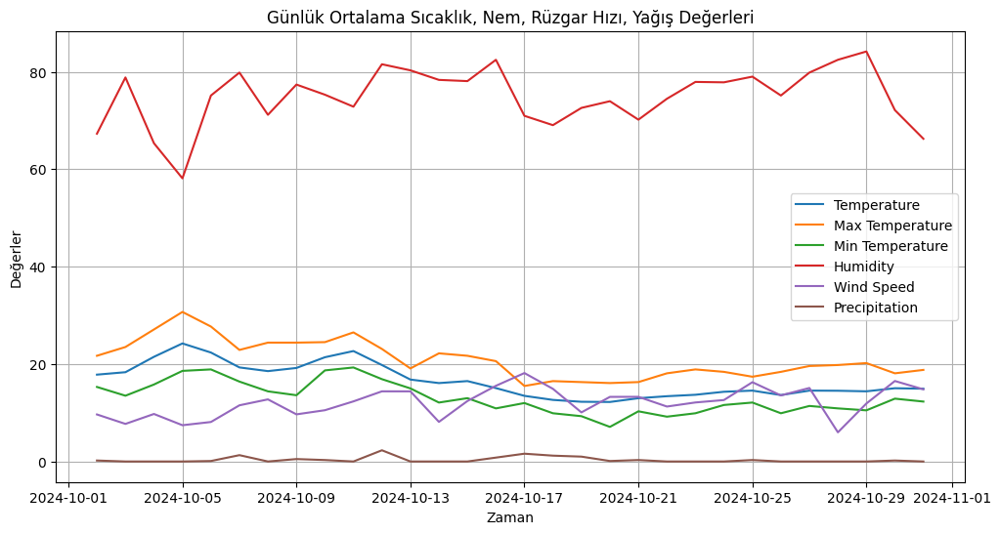

In [27]:
# EKİM AYI
plt.figure(figsize=(12, 6))
sns.lineplot(daily_filtered_df.iloc[93:123], x="Date", y="Avg_Temperature", label="Temperature")
sns.lineplot(daily_filtered_df.iloc[93:123], x="Date", y="Max_Temperature", label="Max Temperature")
sns.lineplot(daily_filtered_df.iloc[93:123], x="Date", y="Min_Temperature", label="Min Temperature")
sns.lineplot(daily_filtered_df.iloc[93:123], x="Date", y="Avg_Humidity", label="Humidity")
sns.lineplot(daily_filtered_df.iloc[93:123], x="Date", y="Avg_Wind_Speed", label="Wind Speed")
sns.lineplot(daily_filtered_df.iloc[93:123], x="Date", y="Total_Precipitation", label="Precipitation")
plt.title("Günlük Ortalama Sıcaklık, Nem, Rüzgar Hızı, Yağış Değerleri")
plt.xlabel("Zaman")
plt.ylabel("Değerler")
plt.grid()
plt.show()

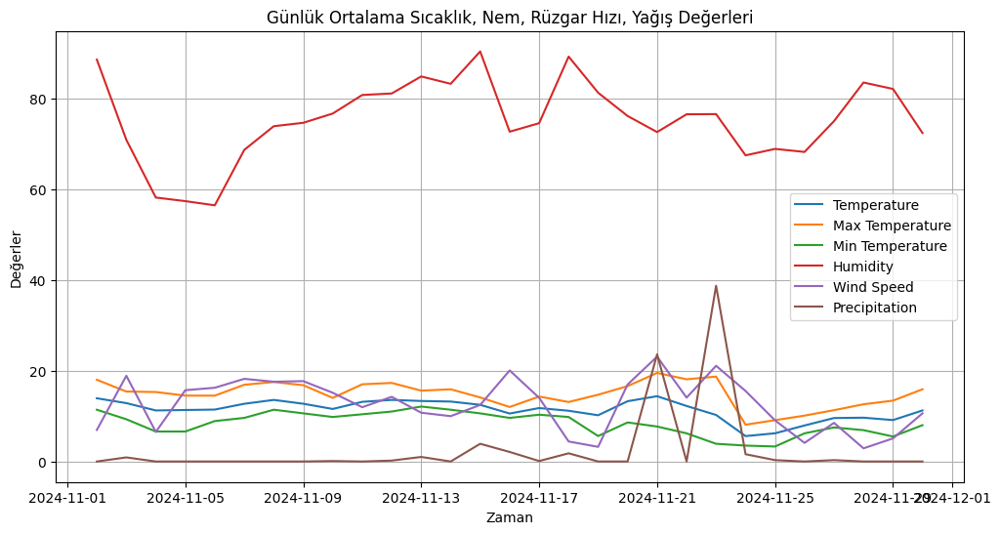

In [28]:
# KASIM AYI
plt.figure(figsize=(12, 6))
sns.lineplot(daily_filtered_df.iloc[124:153], x="Date", y="Avg_Temperature", label="Temperature")
sns.lineplot(daily_filtered_df.iloc[124:153], x="Date", y="Max_Temperature", label="Max Temperature")
sns.lineplot(daily_filtered_df.iloc[124:153], x="Date", y="Min_Temperature", label="Min Temperature")
sns.lineplot(daily_filtered_df.iloc[124:153], x="Date", y="Avg_Humidity", label="Humidity")
sns.lineplot(daily_filtered_df.iloc[124:153], x="Date", y="Avg_Wind_Speed", label="Wind Speed")
sns.lineplot(daily_filtered_df.iloc[124:153], x="Date", y="Total_Precipitation", label="Precipitation")
plt.title("Günlük Ortalama Sıcaklık, Nem, Rüzgar Hızı, Yağış Değerleri")
plt.xlabel("Zaman")
plt.ylabel("Değerler")
plt.grid()
plt.show()

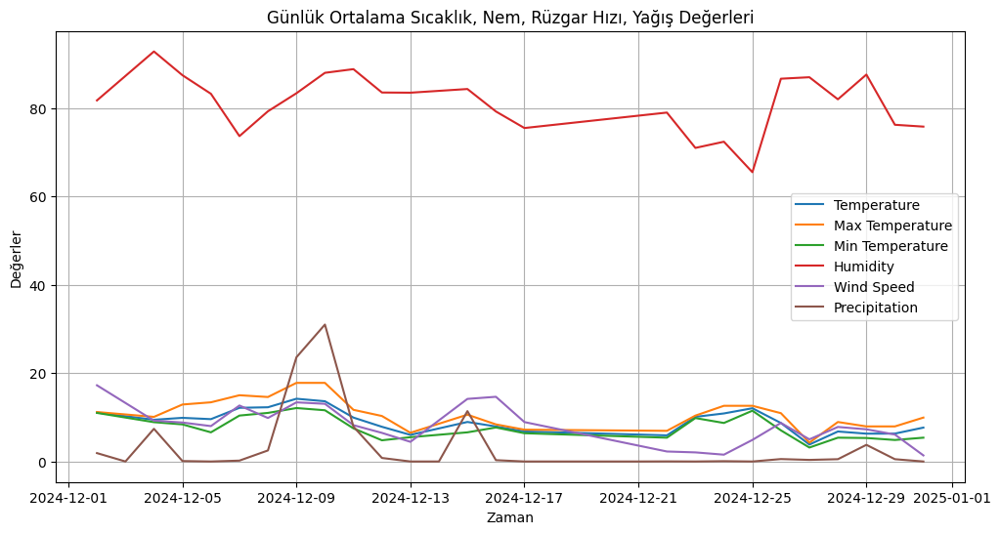

In [29]:
#ARALIK AYI
plt.figure(figsize=(12, 6))
sns.lineplot(daily_filtered_df.iloc[154:182], x="Date", y="Avg_Temperature", label="Temperature")
sns.lineplot(daily_filtered_df.iloc[154:182], x="Date", y="Max_Temperature", label="Max Temperature")
sns.lineplot(daily_filtered_df.iloc[154:182], x="Date", y="Min_Temperature", label="Min Temperature")
sns.lineplot(daily_filtered_df.iloc[154:182], x="Date", y="Avg_Humidity", label="Humidity")
sns.lineplot(daily_filtered_df.iloc[154:182], x="Date", y="Avg_Wind_Speed", label="Wind Speed")
sns.lineplot(daily_filtered_df.iloc[154:182], x="Date", y="Total_Precipitation", label="Precipitation")
plt.title("Günlük Ortalama Sıcaklık, Nem, Rüzgar Hızı, Yağış Değerleri")
plt.xlabel("Zaman")
plt.ylabel("Değerler")
plt.grid()
plt.show()

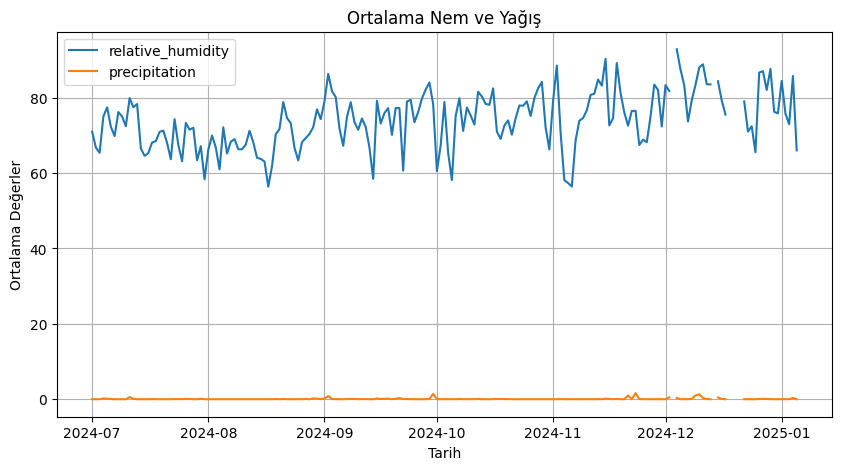

In [30]:
mean_humidity_precipitation = weather_df.groupby(weather_df["datetime"].dt.date)[["relative_humidity", "precipitation"]].mean()

mean_humidity_precipitation.plot(figsize=(10, 5))
plt.title("Ortalama Nem ve Yağış")
plt.xlabel("Tarih")
plt.ylabel("Ortalama Değerler")
plt.grid()
plt.show()

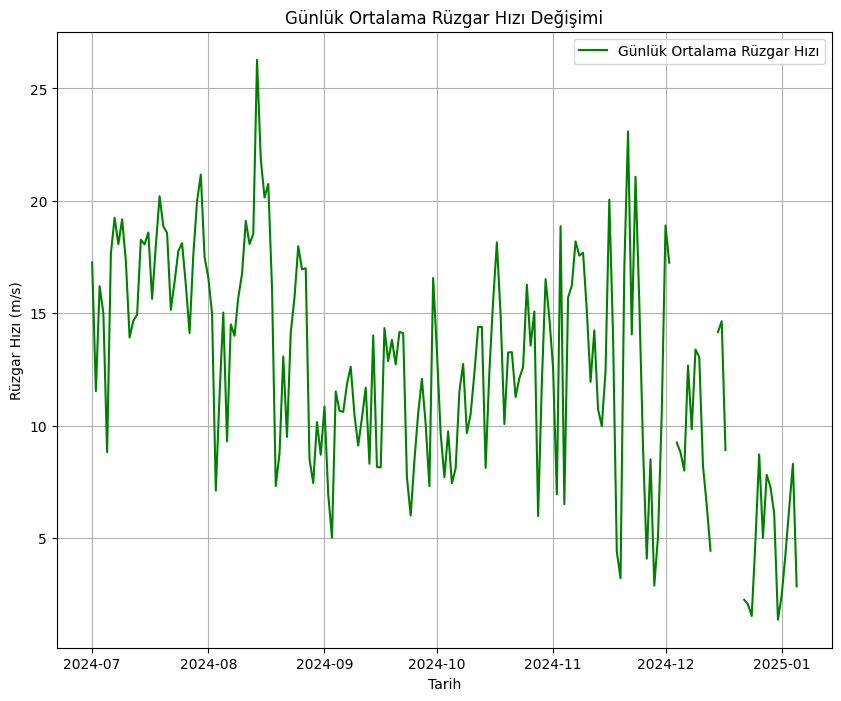

In [31]:
daily_wind_speed = weather_df.groupby(weather_df["datetime"].dt.date)["wind_speed"].mean()

plt.figure(figsize=(10, 8))
plt.plot(daily_wind_speed.index, daily_wind_speed, label="Günlük Ortalama Rüzgar Hızı", color="green")
plt.title("Günlük Ortalama Rüzgar Hızı Değişimi")
plt.xlabel("Tarih")
plt.ylabel("Rüzgar Hızı (m/s)")
plt.legend()
plt.grid()
plt.show()

In [38]:
weather_df["wind_speed"].unique()

array([10.8 ,  8.75, 13.2 ,  7.2 ,  7.72,  5.14,  4.12,  2.06,  2.57,
        4.63,  3.09,  6.17, 10.9 ,  9.1 ,  6.4 ,   nan,  8.23,  3.6 ,
        6.69,  9.3 ,  1.03,  5.66,  7.5 ,  5.2 , 11.5 ,  3.5 , 12.1 ,
       12.7 ,  6.7 ,  9.5 ,  1.5 ,  0.51, 32.3 , 30.  , 25.9 , 13.  ,
       24.2 ,  2.5 ,  8.8 ,  8.6 , 12.4 , 13.6 , 14.4 , 26.3 , 14.5 ,
       27.5 , 29.7 , 25.8 , 25.3 , 20.9 , 16.6 , 15.  , 10.4 , 14.9 ,
        2.7 , 18.4 ,  8.5 ,  9.8 , 19.3 ,  6.5 ,  6.  ,  5.3 , 22.9 ,
        8.1 ,  7.  ,  8.7 ,  5.  ,  4.7 ,  9.6 , 23.9 ,  6.1 ,  6.6 ,
       25.5 ,  4.9 ,  8.4 ,  4.4 ,  2.4 ,  5.4 ,  4.6 ,  3.8 , 20.6 ,
       25.2 ,  8.9 ,  9.77, 23.5 , 13.9 , 10.6 , 11.6 , 16.9 , 21.6 ,
       21.  ,  9.26, 15.8 , 16.  , 11.8 , 16.4 , 10.1 , 13.4 , 16.2 ,
       18.3 ,  9.2 , 12.2 , 18.9 , 11.3 , 16.3 , 12.  , 10.5 , 13.3 ,
       14.7 , 11.2 , 10.3 , 20.3 , 24.9 , 19.8 , 20.4 , 19.6 , 12.5 ,
       23.1 , 20.7 , 11.4 , 18.6 , 20.  , 17.1 , 24.5 , 27.2 , 11.9 ,
       13.8 , 27.7 ,

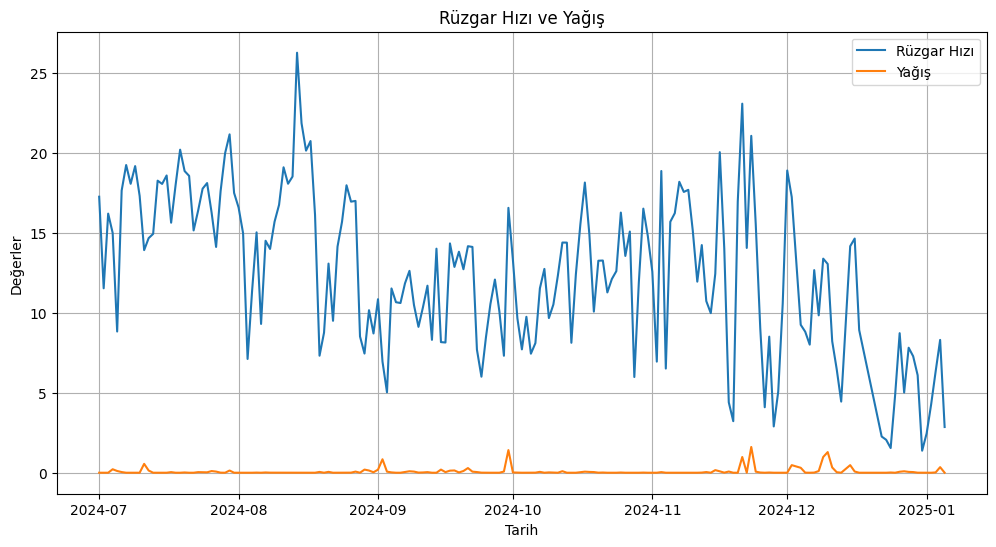

In [42]:
daily_mean_df = weather_df.groupby(weather_df["datetime"].dt.date)[["wind_speed", "precipitation"]].mean()

plt.figure(figsize=(12, 6))
sns.lineplot(daily_mean_df, x="datetime", y="wind_speed", label="Rüzgar Hızı")
sns.lineplot(daily_mean_df, x="datetime", y="precipitation", label="Yağış")
plt.title("Rüzgar Hızı ve Yağış")
plt.xlabel("Tarih")
plt.ylabel("Değerler")
plt.grid()
plt.show()

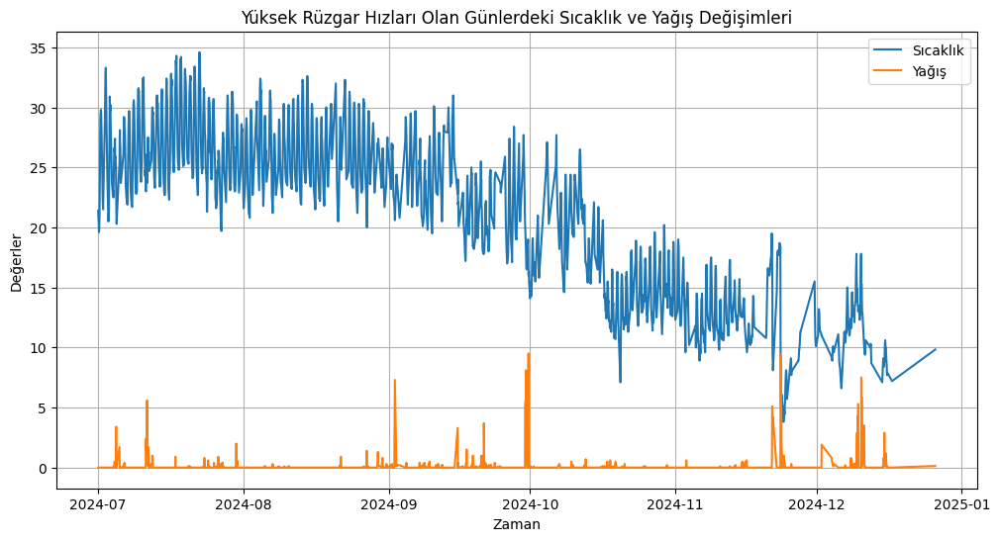

In [32]:
wind_filtered = weather_df[weather_df["wind_speed"] > 10]

plt.figure(figsize=(12, 6))
sns.lineplot(wind_filtered, x="datetime", y="temperature", label="Sıcaklık")
sns.lineplot(wind_filtered, x="datetime", y="precipitation", label="Yağış")
plt.title("Yüksek Rüzgar Hızları Olan Günlerdeki Sıcaklık ve Yağış Değişimleri")
plt.xlabel("Zaman")
plt.ylabel("Değerler")
plt.grid()
plt.show()

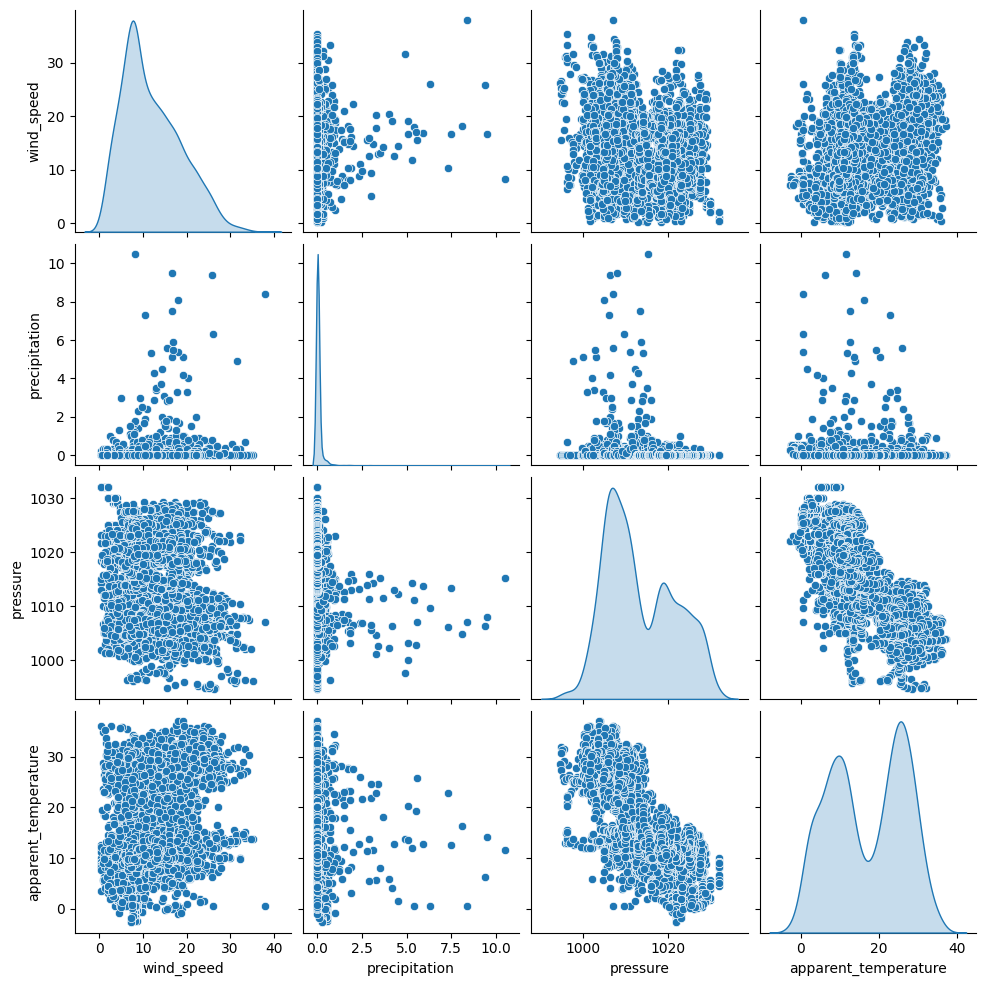

In [43]:
sns.pairplot(weather_df[['wind_speed', 'precipitation', 'pressure', 'apparent_temperature']], diag_kind="kde")
plt.show()

In [33]:
rain_days = weather_df[weather_df["precipitation"] > 0]
no_rain_days = weather_df[weather_df["precipitation"] == 0]

rain_days_temp = rain_days["temperature"].mean()
rain_days_humidity = rain_days["relative_humidity"].mean()
no_rain_days_temp = no_rain_days["temperature"].mean()
no_rain_days_humidity = no_rain_days["relative_humidity"].mean()

print("Yağışlı Günlerin Ortalama Sıcaklığı:",rain_days_temp, "\nYağışlı Günlerin Ortalama Nem Değeri:", rain_days_humidity,
      "\nYağışsız Günlerin Ortalama Sıcaklığı:",no_rain_days_temp, "\nYağışsız Günlerin Ortalama Nem Değeri:", no_rain_days_humidity)

Yağışlı Günlerin Ortalama Sıcaklığı: 13.8098635235732 
Yağışlı Günlerin Ortalama Nem Değeri: 80.1029776674938 
Yağışsız Günlerin Ortalama Sıcaklığı: 18.49552947180403 
Yağışsız Günlerin Ortalama Nem Değeri: 73.10793569788211


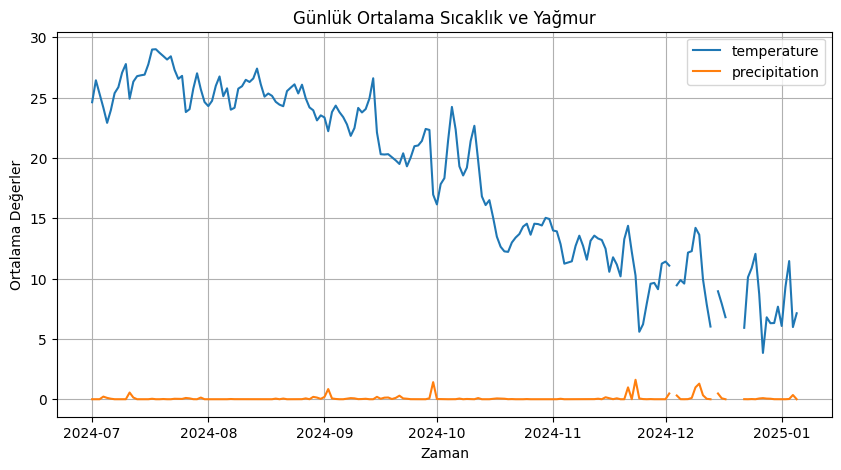

In [34]:
mean_precipitation_temp = weather_df.groupby(weather_df["datetime"].dt.date)[["temperature", "precipitation"]].mean()

mean_precipitation_temp.plot(figsize=(10, 5))
plt.title("Günlük Ortalama Sıcaklık ve Yağmur")
plt.xlabel("Zaman")
plt.ylabel("Ortalama Değerler")
plt.grid()
plt.show()

In [6]:
weather_df.groupby("weather_code")[["temperature", "apparent_temperature", "relative_humidity", "precipitation", "snowfall", "wind_speed"]].mean()

,temperature,apparent_temperature,relative_humidity,precipitation,snowfall,wind_speed
weather_code,,,,,,
0.0,21.908615,22.353162,71.590513,0.000000,0.00,13.857579
1.0,19.187432,18.802368,71.528233,0.000000,0.00,13.176503
2.0,18.217182,17.615808,71.491409,0.000000,0.00,12.449141
3.0,16.113659,15.243609,76.969925,0.000000,0.00,11.485088
51.0,19.330383,19.112389,76.235988,0.175811,0.00,14.171976
53.0,17.722059,17.122059,79.529412,0.651471,0.00,14.972059
55.0,17.327273,17.154545,81.363636,1.054545,0.00,12.290909
61.0,17.685714,17.819048,86.714286,1.719048,0.00,13.357143
63.0,14.685185,13.622222,90.629630,4.381481,0.00,15.848148


In [5]:
weather_df["weather_code"].value_counts()

weather_code
0.0      1834
3.0       798
800.0     567
1.0       549
803.0     532
51.0      339
2.0       291
802.0     157
801.0     101
53.0       68
300.0      38
701.0      31
63.0       27
61.0       21
55.0       11
65.0        5
521.0       3
520.0       1
73.0        1
804.0       1
Name: count, dtype: int64

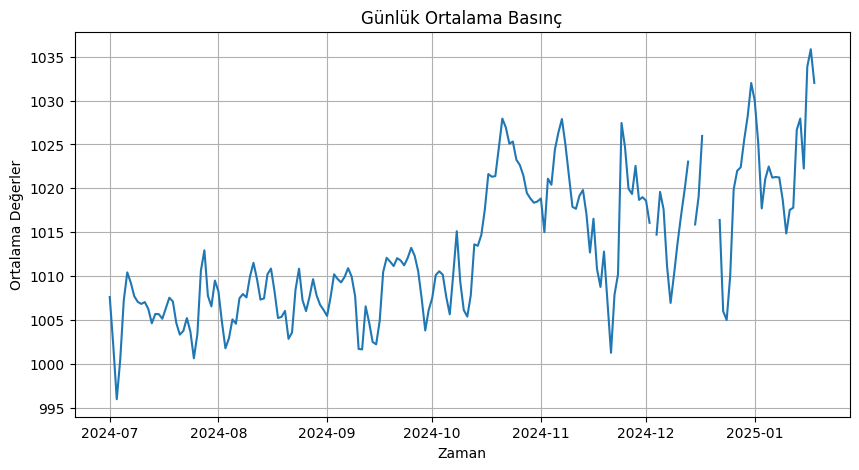

In [6]:
import matplotlib.pyplot as plt
mean_pressure_temp = weather_df.groupby(weather_df["datetime"].dt.date)["pressure"].mean()

mean_pressure_temp.plot(figsize=(10, 5))
plt.title("Günlük Ortalama Basınç")
plt.xlabel("Zaman")
plt.ylabel("Ortalama Değerler")
plt.grid()
plt.show()

In [3]:
import numpy as np

In [4]:
def get_hour_period(hour):
    if 6 <= hour < 12:
        return "Morning"
    elif 12 <= hour < 18:
        return "Afternoon"
    elif 18 <= hour < 24:
        return "Evening"
    else:
        return "Night"
        
weather_df['datetime'] = pd.to_datetime(weather_df['datetime'])
  
weather_df["hour_period"] = weather_df["datetime"].dt.hour.apply(get_hour_period)
weather_df["precipitation_situation"] = (weather_df["precipitation"] > 0).astype(int)
weather_df["max_min_temp_diff"] = weather_df["max_temperature"] - weather_df["min_temperature"]
weather_df["temp_apparent_diff"] = weather_df["temperature"] - weather_df["apparent_temperature"]
weather_df["daily_avg_temp"] = (weather_df["max_temperature"] + weather_df["min_temperature"] + weather_df["temperature"]) /3
weather_df["daylight_duration"] = (weather_df["sunset"] - weather_df["sunrise"]).dt.total_seconds() / 3600
grouped = weather_df.groupby("hour_period").agg(
        max_humidity=("relative_humidity", "max"),
        min_temperature=("temperature", "min")
).reset_index()
            
grouped["mean_humidity_temp"] = (grouped["max_humidity"] + grouped["min_temperature"]) / 2

weather_df = weather_df.merge(
        grouped[["hour_period", "mean_humidity_temp"]],
        on="hour_period",
        how="left"
)
            
weather_df["temperature_rolling_mean_3"] = weather_df["temperature"].rolling(window=3).mean()
weather_df["temperature_pct_change"] = weather_df["temperature"].pct_change()
weather_df["temperature_lag_1"] = weather_df["temperature"].shift(1)
weather_df["humidity_rolling_mean_3"] = weather_df["relative_humidity"].rolling(window=3).mean()
weather_df["humidity_pct_change"] = weather_df["relative_humidity"].pct_change()
weather_df["humidity_lag_1"] = weather_df["relative_humidity"].shift(1)
weather_df["apparent_rolling_mean_3"] = weather_df["apparent_temperature"].rolling(window=3).mean()
weather_df["apparent_lag_1"] = weather_df["apparent_temperature"].shift(1)
weather_df["precipitation_lag_1"] = weather_df["precipitation"].shift(1)
weather_df["pressure_rolling_mean_3"] = weather_df["pressure"].rolling(window=3).mean()
weather_df["pressure_pct_change"] = weather_df["pressure"].pct_change()
weather_df["pressure_lag_1"] = weather_df["pressure"].shift(1)
weather_df["wind_speed_rolling_mean_3"] = weather_df["wind_speed"].rolling(window=3).mean()
weather_df["wind_speed_lag_1"] = weather_df["wind_speed"].shift(1)
weather_df["wind_direction_sin"] = np.sin(np.deg2rad(weather_df["wind_direction"]))
weather_df["wind_direction_cos"] = np.cos(np.deg2rad(weather_df["wind_direction"]))
weather_description = {
        803: "broken clouds",  #parçalı bulutlu
        51: "light drizzle",   #hafif çiseleyen yağmur
        701: "mist",           #sis
        741: "mist",
        300: "light drizzle",  #hafif çiseleyen yağmur
        802: "scattered clouds",  #dağınık bulutlar
        800: "clear sky",         #açık hava
        801: "few clouds",        #birkaç bulut
        520: "light intensity shower rain",    #hafif şiddetli sağanak yağış
        500: "light rain",        #hafif yağmur
        501: "moderate rain",     #orta şiddette yağmur
        0: "clear sky",   #açık hava
        3: "lowering",   #kapalı
        2: "broken clouds",   #parçalı bulutlu
        521: "shower rain",   #sağanak yağış
        1: "clear sky",       #açık hava
        53: "medium drizzle",  #orta derecede çiseleyen yağmur
        55: "heavy drizzle",   #şiddetli çiseleyen yağmur
        61: "light rain",      #hafif yağmur
        63: "moderate rain",     #orta yağmur
        65: "heavy rain",      #şiddetli yağmur
        73: "light snowfall",  #hafif kar yağışı
        804: "overcast clouds",  #bulutlu
}
weather_df["weather_description"] = weather_df["weather_code"].map(weather_description)

weather_df.fillna(method='bfill', inplace=True)

C:\Users\BUSE\AppData\Local\Temp\ipykernel_3468\504121510.py:75: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  weather_df.fillna(method='bfill', inplace=True)


In [5]:
selected_columns = ["id", "data_type", "weather_code", "max_temperature", "min_temperature", 
                    "mean_apparent_temp", "precipitation_sum", "snowfall_sum", "sunrise", "sunset",
                    "max_wind_speed", "dominant_wind_dir", "description"]
weather_df = weather_df.drop(selected_columns, axis=1)

In [6]:
from sklearn.preprocessing import OneHotEncoder

In [7]:
ohe = OneHotEncoder(sparse_output=False, drop='first')
encoded_columns = ohe.fit_transform(weather_df[["hour_period"]])
encoded_columns_names = ohe.get_feature_names_out(["hour_period"])
encoded_df = pd.DataFrame(encoded_columns, columns=encoded_columns_names)
encoded_df.index = weather_df.index
weather_df = pd.concat([weather_df, encoded_df], axis=1).drop(columns=["hour_period"])

In [8]:
weather_df['year'] = weather_df['datetime'].dt.year
weather_df['month'] = weather_df['datetime'].dt.month
weather_df['day'] = weather_df['datetime'].dt.day
weather_df['weekday'] = weather_df['datetime'].dt.weekday
weather_df['hour'] = weather_df['datetime'].dt.hour

weather_df['sin_hour'] = np.sin(2 * np.pi * weather_df['hour'] / 24)
weather_df['cos_hour'] = np.cos(2 * np.pi * weather_df['hour'] / 24)

weather_df['sin_month'] = np.sin(2 * np.pi * weather_df['month'] / 12)
weather_df['cos_month'] = np.cos(2 * np.pi * weather_df['month'] / 12)

weather_df = weather_df.drop("datetime", axis=1)

In [9]:
from sklearn.preprocessing import StandardScaler, LabelEncoder, MinMaxScaler

In [11]:
X = weather_df.drop(["weather_description"], axis=1)
y = weather_df["weather_description"]
feature_names = X.columns
sc = StandardScaler()
X_scaled = sc.fit_transform(X)
       
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)
vocab_size = len(label_encoder.classes_)

train_size = int(len(X_scaled) * 0.7)
test_size = len(X_scaled) - train_size

X_train, X_test = X_scaled[:train_size], X_scaled[train_size:]
y_train, y_test = y_encoded[:train_size], y_encoded[train_size:]

In [12]:
def create_dataset(X_train, y_train, window_size=10):
    
    # if isinstance(y, pd.Series):
    #     y = y.reset_index(drop=True)

    X_data, y_data = [], []
    for i in range(len(X_train) - window_size):
        X_data.append(X_train[i:i + window_size])
        if i + window_size < len(y_train):
           y_data.append(y_train[i + window_size])
        else:
            break
    # print(f"create_dataset fonksiyonunda X shape: {X.shape}, y shape: {y.shape}")
    return np.array(X_data), np.array(y_data)

X_train_seq, y_train_seq = create_dataset(X_train, y_train)
X_test_seq, y_test_seq = create_dataset(X_test, y_test)

X_train_seq = np.reshape(X_train_seq, (X_train_seq.shape[0], X_train_seq.shape[1], X_train_seq.shape[2]))
X_test_seq = np.reshape(X_test_seq, (X_test_seq.shape[0], X_test_seq.shape[1], X_test_seq.shape[2]))

In [10]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping

In [11]:
from sklearn.metrics import accuracy_score

In [21]:
model = Sequential()
model.add(LSTM(64, input_shape = (X_train_seq.shape[1], X_train_seq.shape[2]), return_sequences=True))
model.add(Dropout(0.5))
model.add(LSTM(32))
model.add(Dense(vocab_size, activation="softmax" if vocab_size > 1 else "linear"))
model.compile(loss= "sparse_categorical_crossentropy" if vocab_size > 1 else "mse", optimizer="adam", 
                metrics=["accuracy"] if vocab_size > 1 else ["mse"])
early_stopping = EarlyStopping(monitor="val_loss", patience=30, restore_best_weights=True)
model.fit(X_train_seq, y_train_seq, epochs = 40, batch_size=16, verbose=1, callbacks=[early_stopping])

train_predictions = model.predict(X_train_seq)
test_predictions = model.predict(X_test_seq)

train_predictions = np.argmax(train_predictions, axis=1)
test_predictions = np.argmax(test_predictions, axis=1)

y_train_true = label_encoder.inverse_transform(y_train_seq)
y_train_pred = label_encoder.inverse_transform(train_predictions)

y_test_true = label_encoder.inverse_transform(y_test_seq)
y_test_pred = label_encoder.inverse_transform(test_predictions)

train_accuracy = accuracy_score(y_train_seq, train_predictions)
test_accuracy = accuracy_score(y_test_seq, test_predictions)

print(f"Eğitim Doğruluk (Accuracy): {train_accuracy:.4f}")
print(f"Test Doğruluk (Accuracy): {test_accuracy:.4f}")

Epoch 1/40


C:\Users\BUSE\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


383/383 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.4343 - loss: 1.8328
Epoch 2/40
 25/383 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.5347 - loss: 1.3197

C:\Users\BUSE\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\callbacks\early_stopping.py:153: UserWarning: Early stopping conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,loss
  current = self.get_monitor_value(logs)


383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.5590 - loss: 1.2519
Epoch 3/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.6187 - loss: 1.1225
Epoch 4/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.6501 - loss: 1.0364
Epoch 5/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.6607 - loss: 0.9997
Epoch 6/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.6801 - loss: 0.9466
Epoch 7/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.6952 - loss: 0.9083
Epoch 8/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.7072 - loss: 0.8509
Epoch 9/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.7094 - loss: 0.8293
Epoch 10/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.7200 - loss: 0.8329
Epoch 11/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.7378 - loss: 0.7892
Epoch 12/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.7450 - loss: 0.7533
Epoch 13/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accurac

In [12]:
import matplotlib.pyplot as plt

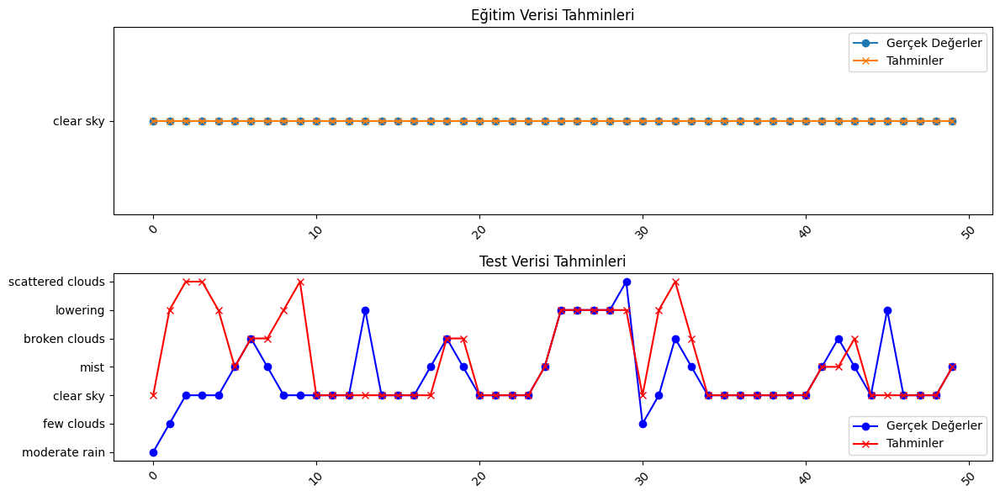

In [22]:
plt.figure(figsize=(12, 6))

plt.subplot(2, 1, 1)
plt.plot(y_train_true[:50], label="Gerçek Değerler", marker="o")
plt.plot(y_train_pred[:50], label="Tahminler", marker="x")
plt.title("Eğitim Verisi Tahminleri")
plt.legend()
plt.xticks(rotation=45)

plt.subplot(2, 1, 2)
plt.plot(y_test_true[:50], label="Gerçek Değerler", marker="o", color="blue")
plt.plot(y_test_pred[:50], label="Tahminler", marker="x", color="red")
plt.title("Test Verisi Tahminleri")
plt.legend()
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

In [23]:
model = Sequential()
model.add(LSTM(64, input_shape = (X_train_seq.shape[1], X_train_seq.shape[2]), return_sequences=True, activation="relu"))
model.add(Dropout(0.5))
model.add(LSTM(32, activation="relu"))
model.add(Dense(vocab_size, activation="softmax" if vocab_size > 1 else "linear"))
model.compile(loss= "sparse_categorical_crossentropy" if vocab_size > 1 else "mse", optimizer="adam", 
                metrics=["accuracy"] if vocab_size > 1 else ["mse"])
early_stopping = EarlyStopping(monitor="val_loss", patience=30, restore_best_weights=True)
model.fit(X_train_seq, y_train_seq, epochs = 40, batch_size=16, verbose=1, callbacks=[early_stopping])

train_predictions = model.predict(X_train_seq)
test_predictions = model.predict(X_test_seq)

train_predictions = np.argmax(train_predictions, axis=1)
test_predictions = np.argmax(test_predictions, axis=1)

y_train_true = label_encoder.inverse_transform(y_train_seq)
y_train_pred = label_encoder.inverse_transform(train_predictions)

y_test_true = label_encoder.inverse_transform(y_test_seq)
y_test_pred = label_encoder.inverse_transform(test_predictions)

train_accuracy = accuracy_score(y_train_seq, train_predictions)
test_accuracy = accuracy_score(y_test_seq, test_predictions)

print(f"Eğitim Doğruluk (Accuracy): {train_accuracy:.4f}")
print(f"Test Doğruluk (Accuracy): {test_accuracy:.4f}")

Epoch 1/40


C:\Users\BUSE\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


383/383 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - accuracy: 0.4792 - loss: 1.7051
Epoch 2/40
 14/383 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.5585 - loss: 1.3433

C:\Users\BUSE\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\callbacks\early_stopping.py:153: UserWarning: Early stopping conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,loss
  current = self.get_monitor_value(logs)


383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.5569 - loss: 1.2773
Epoch 3/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.6031 - loss: 1.1696
Epoch 4/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.6137 - loss: 1.1282
Epoch 5/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.6396 - loss: 1.0526
Epoch 6/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.6419 - loss: 1.0327
Epoch 7/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.6644 - loss: 0.9754
Epoch 8/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.6759 - loss: 0.9311
Epoch 9/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.6878 - loss: 0.9100
Epoch 10/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.6900 - loss: 0.8983
Epoch 11/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.6945 - loss: 0.8462
Epoch 12/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.7051 - loss: 0.8260
Epoch 13/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accurac

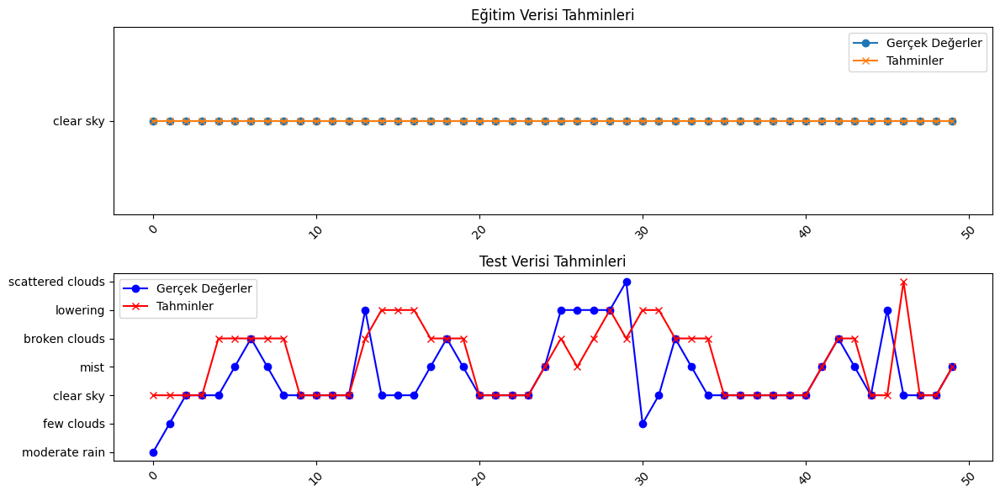

In [24]:
plt.figure(figsize=(12, 6))

plt.subplot(2, 1, 1)
plt.plot(y_train_true[:50], label="Gerçek Değerler", marker="o")
plt.plot(y_train_pred[:50], label="Tahminler", marker="x")
plt.title("Eğitim Verisi Tahminleri")
plt.legend()
plt.xticks(rotation=45)

plt.subplot(2, 1, 2)
plt.plot(y_test_true[:50], label="Gerçek Değerler", marker="o", color="blue")
plt.plot(y_test_pred[:50], label="Tahminler", marker="x", color="red")
plt.title("Test Verisi Tahminleri")
plt.legend()
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

In [26]:
model = Sequential()
model.add(LSTM(64, input_shape = (X_train_seq.shape[1], X_train_seq.shape[2]), return_sequences=True, activation="relu"))
model.add(Dropout(0.6))
model.add(LSTM(32, activation="relu"))
model.add(Dropout(0.6))
model.add(Dense(vocab_size, activation="softmax" if vocab_size > 1 else "linear"))
model.compile(loss= "sparse_categorical_crossentropy" if vocab_size > 1 else "mse", optimizer="adam", 
                metrics=["accuracy"] if vocab_size > 1 else ["mse"])
early_stopping = EarlyStopping(monitor="val_loss", patience=30, restore_best_weights=True)
model.fit(X_train_seq, y_train_seq, epochs = 40, batch_size=16, verbose=1, callbacks=[early_stopping])

train_predictions = model.predict(X_train_seq)
test_predictions = model.predict(X_test_seq)

train_predictions = np.argmax(train_predictions, axis=1)
test_predictions = np.argmax(test_predictions, axis=1)

y_train_true = label_encoder.inverse_transform(y_train_seq)
y_train_pred = label_encoder.inverse_transform(train_predictions)

y_test_true = label_encoder.inverse_transform(y_test_seq)
y_test_pred = label_encoder.inverse_transform(test_predictions)

train_accuracy = accuracy_score(y_train_seq, train_predictions)
test_accuracy = accuracy_score(y_test_seq, test_predictions)

print(f"Eğitim Doğruluk (Accuracy): {train_accuracy:.4f}")
print(f"Test Doğruluk (Accuracy): {test_accuracy:.4f}")

Epoch 1/40


C:\Users\BUSE\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


383/383 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.4285 - loss: 1.9956
Epoch 2/40
 28/383 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.4878 - loss: 1.5834

C:\Users\BUSE\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\callbacks\early_stopping.py:153: UserWarning: Early stopping conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,loss
  current = self.get_monitor_value(logs)


383/383 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.5010 - loss: 1.5330
Epoch 3/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.5245 - loss: 1.4131
Epoch 4/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.5348 - loss: 1.3744
Epoch 5/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.5547 - loss: 1.3084
Epoch 6/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.5854 - loss: 1.2230
Epoch 7/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.5716 - loss: 1.2458
Epoch 8/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.5834 - loss: 1.2109
Epoch 9/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.5970 - loss: 1.1750
Epoch 10/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.5992 - loss: 1.1359
Epoch 11/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.5882 - loss: 1.1555
Epoch 12/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.6014 - loss: 1.1298
Epoch 13/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accurac

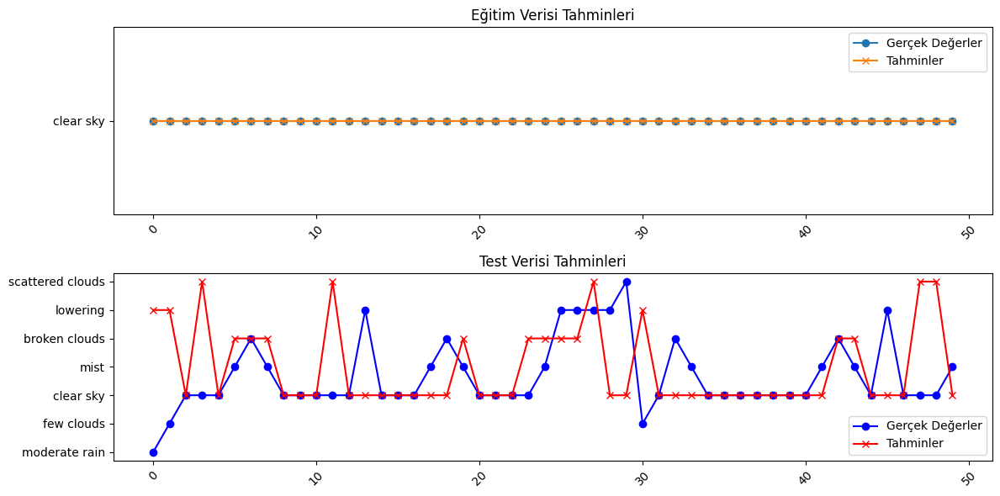

In [27]:
plt.figure(figsize=(12, 6))

plt.subplot(2, 1, 1)
plt.plot(y_train_true[:50], label="Gerçek Değerler", marker="o")
plt.plot(y_train_pred[:50], label="Tahminler", marker="x")
plt.title("Eğitim Verisi Tahminleri")
plt.legend()
plt.xticks(rotation=45)

plt.subplot(2, 1, 2)
plt.plot(y_test_true[:50], label="Gerçek Değerler", marker="o", color="blue")
plt.plot(y_test_pred[:50], label="Tahminler", marker="x", color="red")
plt.title("Test Verisi Tahminleri")
plt.legend()
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

In [13]:
from tensorflow.keras.optimizers import Adam

In [29]:
model = Sequential()
model.add(LSTM(64, input_shape = (X_train_seq.shape[1], X_train_seq.shape[2]), return_sequences=True, activation="relu"))
model.add(Dropout(0.3))
model.add(LSTM(32, activation="relu"))
model.add(Dropout(0.3))
optimizer = Adam(learning_rate=0.0005)
model.add(Dense(vocab_size, activation="softmax" if vocab_size > 1 else "linear"))
model.compile(loss= "sparse_categorical_crossentropy" if vocab_size > 1 else "mse", optimizer=optimizer, 
                metrics=["accuracy"] if vocab_size > 1 else ["mse"])
early_stopping = EarlyStopping(monitor="val_loss", patience=30, restore_best_weights=True)
model.fit(X_train_seq, y_train_seq, epochs = 40, batch_size=16, verbose=1, callbacks=[early_stopping])

train_predictions = model.predict(X_train_seq)
test_predictions = model.predict(X_test_seq)

train_predictions = np.argmax(train_predictions, axis=1)
test_predictions = np.argmax(test_predictions, axis=1)

y_train_true = label_encoder.inverse_transform(y_train_seq)
y_train_pred = label_encoder.inverse_transform(train_predictions)

y_test_true = label_encoder.inverse_transform(y_test_seq)
y_test_pred = label_encoder.inverse_transform(test_predictions)

train_accuracy = accuracy_score(y_train_seq, train_predictions)
test_accuracy = accuracy_score(y_test_seq, test_predictions)

print(f"Eğitim Doğruluk (Accuracy): {train_accuracy:.4f}")
print(f"Test Doğruluk (Accuracy): {test_accuracy:.4f}")

Epoch 1/40


C:\Users\BUSE\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


383/383 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.4318 - loss: 1.9568
Epoch 2/40
 24/383 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.4994 - loss: 1.5689

C:\Users\BUSE\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\callbacks\early_stopping.py:153: UserWarning: Early stopping conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,loss
  current = self.get_monitor_value(logs)


383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.5120 - loss: 1.4827
Epoch 3/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.5520 - loss: 1.3504
Epoch 4/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.5901 - loss: 1.2170
Epoch 5/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.6063 - loss: 1.1758
Epoch 6/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.5990 - loss: 1.1496
Epoch 7/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.6179 - loss: 1.1204
Epoch 8/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.6230 - loss: 1.0789
Epoch 9/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.6392 - loss: 1.0491
Epoch 10/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.6352 - loss: 1.0280
Epoch 11/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.6553 - loss: 0.9868
Epoch 12/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.6601 - loss: 0.9671
Epoch 13/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accurac

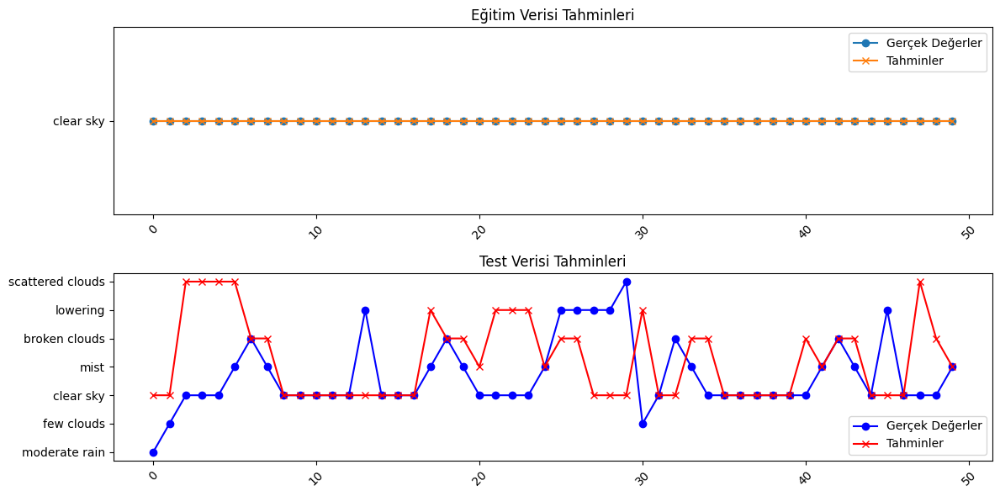

In [30]:
plt.figure(figsize=(12, 6))

plt.subplot(2, 1, 1)
plt.plot(y_train_true[:50], label="Gerçek Değerler", marker="o")
plt.plot(y_train_pred[:50], label="Tahminler", marker="x")
plt.title("Eğitim Verisi Tahminleri")
plt.legend()
plt.xticks(rotation=45)

plt.subplot(2, 1, 2)
plt.plot(y_test_true[:50], label="Gerçek Değerler", marker="o", color="blue")
plt.plot(y_test_pred[:50], label="Tahminler", marker="x", color="red")
plt.title("Test Verisi Tahminleri")
plt.legend()
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

In [14]:
from tensorflow.keras.layers import BatchNormalization

In [33]:
model = Sequential()
model.add(LSTM(64, input_shape = (X_train_seq.shape[1], X_train_seq.shape[2]), return_sequences=True, activation="relu"))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(LSTM(32, activation="relu"))
model.add(BatchNormalization())
model.add(Dropout(0.4))
optimizer = Adam(learning_rate=0.0003)
model.add(Dense(vocab_size, activation="softmax" if vocab_size > 1 else "linear"))
model.compile(loss= "sparse_categorical_crossentropy" if vocab_size > 1 else "mse", optimizer=optimizer, 
                metrics=["accuracy"] if vocab_size > 1 else ["mse"])
early_stopping = EarlyStopping(monitor="val_loss", patience=15, restore_best_weights=True)
model.fit(X_train_seq, y_train_seq, epochs = 40, batch_size=16, verbose=1, callbacks=[early_stopping])

train_predictions = model.predict(X_train_seq)
test_predictions = model.predict(X_test_seq)

train_predictions = np.argmax(train_predictions, axis=1)
test_predictions = np.argmax(test_predictions, axis=1)

y_train_true = label_encoder.inverse_transform(y_train_seq)
y_train_pred = label_encoder.inverse_transform(train_predictions)

y_test_true = label_encoder.inverse_transform(y_test_seq)
y_test_pred = label_encoder.inverse_transform(test_predictions)

train_accuracy = accuracy_score(y_train_seq, train_predictions)
test_accuracy = accuracy_score(y_test_seq, test_predictions)

print(f"Eğitim Doğruluk (Accuracy): {train_accuracy:.4f}")
print(f"Test Doğruluk (Accuracy): {test_accuracy:.4f}")

Epoch 1/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - accuracy: 0.1525 - loss: 3.1510
Epoch 2/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.3496 - loss: 2.3033
Epoch 3/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - accuracy: 0.4624 - loss: 1.9162
Epoch 4/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5349 - loss: 1.6341
Epoch 5/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - accuracy: 0.5448 - loss: 1.5198
Epoch 6/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.5709 - loss: 1.4237
Epoch 7/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.5756 - loss: 1.3705
Epoch 8/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.5733 - loss: 1.3231
Epoch 9/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.5809 - loss: 1.2925
Epoch 10/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.5925 - loss: 1.2465
Epoch 11/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.5963 - loss: 1.2438
Epoch 12/40
383/383 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/

In [34]:
model = Sequential()
model.add(LSTM(64, input_shape = (X_train_seq.shape[1], X_train_seq.shape[2]), return_sequences=True, activation="relu"))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(LSTM(32, activation="relu"))
model.add(BatchNormalization())
model.add(Dropout(0.4))
optimizer = Adam(learning_rate=0.0001)
model.add(Dense(vocab_size, activation="softmax" if vocab_size > 1 else "linear"))
model.compile(loss= "sparse_categorical_crossentropy" if vocab_size > 1 else "mse", optimizer=optimizer, 
                metrics=["accuracy"] if vocab_size > 1 else ["mse"])
early_stopping = EarlyStopping(monitor="val_loss", patience=15, restore_best_weights=True)
model.fit(X_train_seq, y_train_seq, epochs = 40, batch_size=32, verbose=1, callbacks=[early_stopping])

train_predictions = model.predict(X_train_seq)
test_predictions = model.predict(X_test_seq)

train_predictions = np.argmax(train_predictions, axis=1)
test_predictions = np.argmax(test_predictions, axis=1)

y_train_true = label_encoder.inverse_transform(y_train_seq)
y_train_pred = label_encoder.inverse_transform(train_predictions)

y_test_true = label_encoder.inverse_transform(y_test_seq)
y_test_pred = label_encoder.inverse_transform(test_predictions)

train_accuracy = accuracy_score(y_train_seq, train_predictions)
test_accuracy = accuracy_score(y_test_seq, test_predictions)

print(f"Eğitim Doğruluk (Accuracy): {train_accuracy:.4f}")
print(f"Test Doğruluk (Accuracy): {test_accuracy:.4f}")

Epoch 1/40


C:\Users\BUSE\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


192/192 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.0853 - loss: 3.4306
Epoch 2/40
 25/192 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.1669 - loss: 2.9897

C:\Users\BUSE\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\callbacks\early_stopping.py:153: UserWarning: Early stopping conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,loss
  current = self.get_monitor_value(logs)


192/192 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.1886 - loss: 2.8967
Epoch 3/40
192/192 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.2503 - loss: 2.6463
Epoch 4/40
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.3053 - loss: 2.4674
Epoch 5/40
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.3380 - loss: 2.3651
Epoch 6/40
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.3935 - loss: 2.1923
Epoch 7/40
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.4306 - loss: 2.1069
Epoch 8/40
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.4430 - loss: 2.0474
Epoch 9/40
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.4706 - loss: 1.9823
Epoch 10/40
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.5088 - loss: 1.8319
Epoch 11/40
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.5055 - loss: 1.7933
Epoch 12/40
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.5344 - loss: 1.6987
Epoch 13/40
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - acc

In [35]:
model = Sequential()
model.add(LSTM(64, input_shape = (X_train_seq.shape[1], X_train_seq.shape[2]), return_sequences=True, activation="relu"))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(LSTM(32, activation="relu"))
model.add(BatchNormalization())
model.add(Dropout(0.4))
optimizer = Adam(learning_rate=0.0001, clipnorm=1.0)
model.add(Dense(vocab_size, activation="softmax" if vocab_size > 1 else "linear"))
model.compile(loss= "sparse_categorical_crossentropy" if vocab_size > 1 else "mse", optimizer=optimizer, 
                metrics=["accuracy"] if vocab_size > 1 else ["mse"])
early_stopping = EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True)
model.fit(X_train_seq, y_train_seq, epochs = 50, batch_size=32, verbose=1, callbacks=[early_stopping])

train_predictions = model.predict(X_train_seq)
test_predictions = model.predict(X_test_seq)

train_predictions = np.argmax(train_predictions, axis=1)
test_predictions = np.argmax(test_predictions, axis=1)

y_train_true = label_encoder.inverse_transform(y_train_seq)
y_train_pred = label_encoder.inverse_transform(train_predictions)

y_test_true = label_encoder.inverse_transform(y_test_seq)
y_test_pred = label_encoder.inverse_transform(test_predictions)

train_accuracy = accuracy_score(y_train_seq, train_predictions)
test_accuracy = accuracy_score(y_test_seq, test_predictions)

print(f"Eğitim Doğruluk (Accuracy): {train_accuracy:.4f}")
print(f"Test Doğruluk (Accuracy): {test_accuracy:.4f}")

Epoch 1/50


C:\Users\BUSE\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


192/192 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.0836 - loss: 3.3419
Epoch 2/50
 16/192 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.1737 - loss: 2.9137

C:\Users\BUSE\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\callbacks\early_stopping.py:153: UserWarning: Early stopping conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,loss
  current = self.get_monitor_value(logs)


192/192 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.1736 - loss: 2.8436
Epoch 3/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.2363 - loss: 2.6559
Epoch 4/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.3029 - loss: 2.4477
Epoch 5/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.3239 - loss: 2.3565
Epoch 6/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.3748 - loss: 2.2181
Epoch 7/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.3898 - loss: 2.1274
Epoch 8/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.4229 - loss: 2.0474
Epoch 9/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.4699 - loss: 1.9418
Epoch 10/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.4733 - loss: 1.8911
Epoch 11/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.4882 - loss: 1.8123
Epoch 12/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.4960 - loss: 1.7268
Epoch 13/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step -

In [17]:
from tensorflow.keras.regularizers import l2

In [37]:
model = Sequential()
model.add(LSTM(64, input_shape = (X_train_seq.shape[1], X_train_seq.shape[2]), return_sequences=True, activation="relu", kernel_regularizer=l2(0.01)))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(LSTM(32, activation="relu", kernel_regularizer=l2(0.01)))
model.add(BatchNormalization())
model.add(Dropout(0.4))
optimizer = Adam(learning_rate=0.0001, clipnorm=1.0)
model.add(Dense(vocab_size, activation="softmax" if vocab_size > 1 else "linear"))
model.compile(loss= "sparse_categorical_crossentropy" if vocab_size > 1 else "mse", optimizer=optimizer, 
                metrics=["accuracy"] if vocab_size > 1 else ["mse"])
early_stopping = EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True)
model.fit(X_train_seq, y_train_seq, epochs = 50, batch_size=32, verbose=1, callbacks=[early_stopping])

train_predictions = model.predict(X_train_seq)
test_predictions = model.predict(X_test_seq)

train_predictions = np.argmax(train_predictions, axis=1)
test_predictions = np.argmax(test_predictions, axis=1)

y_train_true = label_encoder.inverse_transform(y_train_seq)
y_train_pred = label_encoder.inverse_transform(train_predictions)

y_test_true = label_encoder.inverse_transform(y_test_seq)
y_test_pred = label_encoder.inverse_transform(test_predictions)

train_accuracy = accuracy_score(y_train_seq, train_predictions)
test_accuracy = accuracy_score(y_test_seq, test_predictions)

print(f"Eğitim Doğruluk (Accuracy): {train_accuracy:.4f}")
print(f"Test Doğruluk (Accuracy): {test_accuracy:.4f}")

Epoch 1/50


C:\Users\BUSE\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


192/192 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.0628 - loss: 5.0715
Epoch 2/50
 16/192 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.1364 - loss: 4.6694

C:\Users\BUSE\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\callbacks\early_stopping.py:153: UserWarning: Early stopping conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,loss
  current = self.get_monitor_value(logs)


192/192 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.1551 - loss: 4.4887
Epoch 3/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.2415 - loss: 4.1604
Epoch 4/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.3065 - loss: 3.8801
Epoch 5/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.3539 - loss: 3.6662
Epoch 6/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.3867 - loss: 3.4694
Epoch 7/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.4201 - loss: 3.3195
Epoch 8/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.4495 - loss: 3.1421
Epoch 9/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.4747 - loss: 3.0176
Epoch 10/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.5056 - loss: 2.8576
Epoch 11/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.5125 - loss: 2.7598
Epoch 12/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.5311 - loss: 2.6369
Epoch 13/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accu

In [39]:
model = Sequential()
model.add(LSTM(32, input_shape = (X_train_seq.shape[1], X_train_seq.shape[2]), return_sequences=True, activation="relu", kernel_regularizer=l2(0.01)))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(LSTM(16, activation="relu", kernel_regularizer=l2(0.01)))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(Dense(16, activation="relu", kernel_regularizer=l2(0.01)))  
model.add(Dropout(0.3))
optimizer = Adam(learning_rate=0.00005, clipnorm=1.0)
model.add(Dense(vocab_size, activation="softmax" if vocab_size > 1 else "linear"))
model.compile(loss= "sparse_categorical_crossentropy" if vocab_size > 1 else "mse", optimizer=optimizer, 
                metrics=["accuracy"] if vocab_size > 1 else ["mse"])
early_stopping = EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True)
model.fit(X_train_seq, y_train_seq, epochs = 50, batch_size=32, verbose=1, callbacks=[early_stopping])

train_predictions = model.predict(X_train_seq)
test_predictions = model.predict(X_test_seq)

train_predictions = np.argmax(train_predictions, axis=1)
test_predictions = np.argmax(test_predictions, axis=1)

y_train_true = label_encoder.inverse_transform(y_train_seq)
y_train_pred = label_encoder.inverse_transform(train_predictions)

y_test_true = label_encoder.inverse_transform(y_test_seq)
y_test_pred = label_encoder.inverse_transform(test_predictions)

train_accuracy = accuracy_score(y_train_seq, train_predictions)
test_accuracy = accuracy_score(y_test_seq, test_predictions)

print(f"Eğitim Doğruluk (Accuracy): {train_accuracy:.4f}")
print(f"Test Doğruluk (Accuracy): {test_accuracy:.4f}")

Epoch 1/50


C:\Users\BUSE\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


192/192 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.0354 - loss: 4.5991
Epoch 2/50
 12/192 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.0455 - loss: 4.3751

C:\Users\BUSE\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\callbacks\early_stopping.py:153: UserWarning: Early stopping conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,loss
  current = self.get_monitor_value(logs)


192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.0481 - loss: 4.3470
Epoch 3/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.0593 - loss: 4.1853
Epoch 4/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - accuracy: 0.0680 - loss: 4.0280
Epoch 5/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.0931 - loss: 3.8812
Epoch 6/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.1237 - loss: 3.7525
Epoch 7/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.1498 - loss: 3.6516
Epoch 8/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.1904 - loss: 3.5309
Epoch 9/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.2306 - loss: 3.3981
Epoch 10/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - accuracy: 0.2583 - loss: 3.3201
Epoch 11/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.2801 - loss: 3.2211
Epoch 12/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.3259 - loss: 3.1158
Epoch 13/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step

In [43]:
model = Sequential()
model.add(LSTM(16, input_shape = (X_train_seq.shape[1], X_train_seq.shape[2]), return_sequences=True, activation="relu", kernel_regularizer=l2(0.01)))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(LSTM(8, activation="relu", kernel_regularizer=l2(0.01)))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(16, activation="relu", kernel_regularizer=l2(0.01)))  
optimizer = Adam(learning_rate=0.00005, clipnorm=1.0)
model.add(Dense(vocab_size, activation="softmax" if vocab_size > 1 else "linear"))
model.compile(loss= "sparse_categorical_crossentropy" if vocab_size > 1 else "mse", optimizer=optimizer, 
                metrics=["accuracy"] if vocab_size > 1 else ["mse"])
early_stopping = EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True)
history = model.fit(X_train_seq, y_train_seq, epochs = 50, batch_size=32, validation_data=(X_test_seq, y_test_seq), verbose=1, callbacks=[early_stopping])

train_predictions = model.predict(X_train_seq)
test_predictions = model.predict(X_test_seq)

train_predictions = np.argmax(train_predictions, axis=1)
test_predictions = np.argmax(test_predictions, axis=1)

y_train_true = label_encoder.inverse_transform(y_train_seq)
y_train_pred = label_encoder.inverse_transform(train_predictions)

y_test_true = label_encoder.inverse_transform(y_test_seq)
y_test_pred = label_encoder.inverse_transform(test_predictions)

train_accuracy = accuracy_score(y_train_seq, train_predictions)
test_accuracy = accuracy_score(y_test_seq, test_predictions)

print(f"Eğitim Doğruluk (Accuracy): {train_accuracy:.4f}")
print(f"Test Doğruluk (Accuracy): {test_accuracy:.4f}")

Epoch 1/50


C:\Users\BUSE\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


192/192 ━━━━━━━━━━━━━━━━━━━━ 6s 12ms/step - accuracy: 0.0606 - loss: 3.7001 - val_accuracy: 0.0794 - val_loss: 3.5158
Epoch 2/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.1047 - loss: 3.5471 - val_accuracy: 0.1843 - val_loss: 3.4083
Epoch 3/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.1378 - loss: 3.3977 - val_accuracy: 0.2514 - val_loss: 3.2974
Epoch 4/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.2113 - loss: 3.2788 - val_accuracy: 0.3216 - val_loss: 3.1861
Epoch 5/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.2703 - loss: 3.1719 - val_accuracy: 0.3937 - val_loss: 3.0884
Epoch 6/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.3398 - loss: 3.0848 - val_accuracy: 0.4369 - val_loss: 2.9974
Epoch 7/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.3940 - loss: 2.9746 - val_accuracy: 0.4567 - val_loss: 2.9094
Epoch 8/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.4281 - loss: 2.8826 - val_accuracy: 0.459

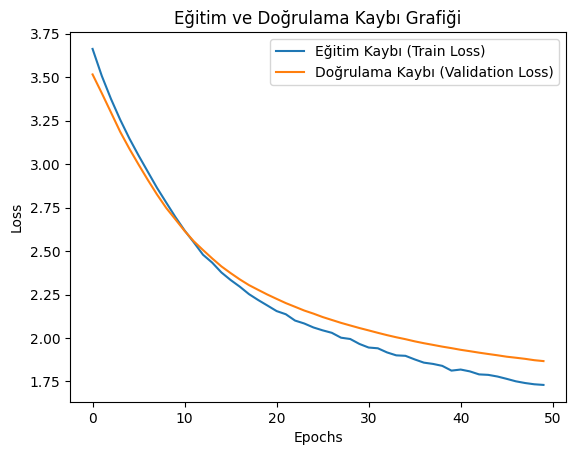

In [44]:
plt.plot(history.history['loss'], label='Eğitim Kaybı (Train Loss)')
plt.plot(history.history['val_loss'], label='Doğrulama Kaybı (Validation Loss)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Eğitim ve Doğrulama Kaybı Grafiği')
plt.show()

In [45]:
from sklearn.utils.class_weight import compute_class_weight

In [50]:
model = Sequential()
model.add(LSTM(128, input_shape = (X_train_seq.shape[1], X_train_seq.shape[2]), return_sequences=True, activation="relu", kernel_regularizer=l2(0.01)))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(LSTM(64, activation="relu", kernel_regularizer=l2(0.01)))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(32, activation="relu"))
model.add(Dense(16, activation="relu", kernel_regularizer=l2(0.01)))  
optimizer = Adam(learning_rate=0.00005, clipnorm=1.0)
model.add(Dense(vocab_size, activation="softmax" if vocab_size > 1 else "linear"))
model.compile(loss= "sparse_categorical_crossentropy" if vocab_size > 1 else "mse", optimizer=optimizer, 
                metrics=["accuracy"] if vocab_size > 1 else ["mse"])
early_stopping = EarlyStopping(monitor="val_loss", patience=15, restore_best_weights=True)
history = model.fit(X_train_seq, y_train_seq, epochs = 50, batch_size=32, 
                    validation_data=(X_test_seq, y_test_seq), verbose=1, callbacks=[early_stopping])

train_predictions = model.predict(X_train_seq)
test_predictions = model.predict(X_test_seq)

train_predictions = np.argmax(train_predictions, axis=1)
test_predictions = np.argmax(test_predictions, axis=1)

y_train_true = label_encoder.inverse_transform(y_train_seq)
y_train_pred = label_encoder.inverse_transform(train_predictions)

y_test_true = label_encoder.inverse_transform(y_test_seq)
y_test_pred = label_encoder.inverse_transform(test_predictions)

train_accuracy = accuracy_score(y_train_seq, train_predictions)
test_accuracy = accuracy_score(y_test_seq, test_predictions)

print(f"Eğitim Doğruluk (Accuracy): {train_accuracy:.4f}")
print(f"Test Doğruluk (Accuracy): {test_accuracy:.4f}")

Epoch 1/50


C:\Users\BUSE\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


192/192 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - accuracy: 0.0806 - loss: 5.4343 - val_accuracy: 0.1538 - val_loss: 5.2617
Epoch 2/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - accuracy: 0.2205 - loss: 4.9670 - val_accuracy: 0.2614 - val_loss: 4.7798
Epoch 3/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.3461 - loss: 4.5417 - val_accuracy: 0.4208 - val_loss: 4.3816
Epoch 4/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.4280 - loss: 4.1840 - val_accuracy: 0.4685 - val_loss: 4.0592
Epoch 5/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - accuracy: 0.4868 - loss: 3.8478 - val_accuracy: 0.4723 - val_loss: 3.8216
Epoch 6/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5213 - loss: 3.5968 - val_accuracy: 0.4750 - val_loss: 3.6264
Epoch 7/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5330 - loss: 3.3832 - val_accuracy: 0.4880 - val_loss: 3.4568
Epoch 8/50
192/192 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - accuracy: 0.5437 - loss: 3.2409 - val_accuracy: 0.48

In [54]:
model = Sequential()
model.add(LSTM(16, input_shape = (X_train_seq.shape[1], X_train_seq.shape[2]), return_sequences=True, activation="relu", kernel_regularizer=l2(0.01)))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(LSTM(8, activation="relu", kernel_regularizer=l2(0.01)))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(16, activation="relu", kernel_regularizer=l2(0.01)))  
optimizer = Adam(learning_rate=0.00005, clipnorm=1.0)
model.add(Dense(vocab_size, activation="softmax" if vocab_size > 1 else "linear"))
model.compile(loss= "sparse_categorical_crossentropy" if vocab_size > 1 else "mse", optimizer=optimizer, 
                metrics=["accuracy"] if vocab_size > 1 else ["mse"])
early_stopping = EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True)
history = model.fit(X_train_seq, y_train_seq, epochs = 200, batch_size=32, validation_data=(X_test_seq, y_test_seq), verbose=1, callbacks=[early_stopping])

train_predictions = model.predict(X_train_seq)
test_predictions = model.predict(X_test_seq)

train_predictions = np.argmax(train_predictions, axis=1)
test_predictions = np.argmax(test_predictions, axis=1)

y_train_true = label_encoder.inverse_transform(y_train_seq)
y_train_pred = label_encoder.inverse_transform(train_predictions)

y_test_true = label_encoder.inverse_transform(y_test_seq)
y_test_pred = label_encoder.inverse_transform(test_predictions)

train_accuracy = accuracy_score(y_train_seq, train_predictions)
test_accuracy = accuracy_score(y_test_seq, test_predictions)

print(f"Eğitim Doğruluk (Accuracy): {train_accuracy:.4f}")
print(f"Test Doğruluk (Accuracy): {test_accuracy:.4f}")

Epoch 1/200


C:\Users\BUSE\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


192/192 ━━━━━━━━━━━━━━━━━━━━ 6s 12ms/step - accuracy: 0.1810 - loss: 3.4331 - val_accuracy: 0.2701 - val_loss: 3.3142
Epoch 2/200
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.2317 - loss: 3.3127 - val_accuracy: 0.3209 - val_loss: 3.2132
Epoch 3/200
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.2989 - loss: 3.2050 - val_accuracy: 0.4060 - val_loss: 3.1359
Epoch 4/200
192/192 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.3368 - loss: 3.1158 - val_accuracy: 0.4365 - val_loss: 3.0702
Epoch 5/200
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.3667 - loss: 3.0597 - val_accuracy: 0.4525 - val_loss: 3.0091
Epoch 6/200
192/192 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.3781 - loss: 2.9910 - val_accuracy: 0.4586 - val_loss: 2.9555
Epoch 7/200
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.4170 - loss: 2.9090 - val_accuracy: 0.4685 - val_loss: 2.8978
Epoch 8/200
192/192 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.4353 - loss: 2.8625 - val_accuracy: 0.47

In [55]:
from tensorflow.keras.layers import LeakyReLU

In [68]:
model = Sequential()
model.add(LSTM(32, input_shape = (X_train_seq.shape[1], X_train_seq.shape[2]), return_sequences=True, activation= "relu", kernel_regularizer=l2(0.01)))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(LSTM(32, activation="relu", kernel_regularizer=l2(0.01)))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(16, activation="relu", kernel_regularizer=l2(0.01)))  
model.add(Dense(8, activation="relu", kernel_regularizer=l2(0.01))) 
optimizer = Adam(learning_rate=0.00005, clipnorm=1.0)
model.add(Dense(vocab_size, activation="softmax" if vocab_size > 1 else "linear"))
model.compile(loss= "sparse_categorical_crossentropy" if vocab_size > 1 else "mse", optimizer=optimizer, 
                metrics=["accuracy"] if vocab_size > 1 else ["mse"])
early_stopping = EarlyStopping(monitor="val_loss", patience=20, restore_best_weights=True)
history = model.fit(X_train_seq, y_train_seq, epochs = 100, batch_size=84, validation_data=(X_test_seq, y_test_seq), verbose=1, callbacks=[early_stopping])

train_predictions = model.predict(X_train_seq)
test_predictions = model.predict(X_test_seq)

train_predictions = np.argmax(train_predictions, axis=1)
test_predictions = np.argmax(test_predictions, axis=1)

y_train_true = label_encoder.inverse_transform(y_train_seq)
y_train_pred = label_encoder.inverse_transform(train_predictions)

y_test_true = label_encoder.inverse_transform(y_test_seq)
y_test_pred = label_encoder.inverse_transform(test_predictions)

train_accuracy = accuracy_score(y_train_seq, train_predictions)
test_accuracy = accuracy_score(y_test_seq, test_predictions)

print(f"Eğitim Doğruluk (Accuracy): {train_accuracy:.4f}")
print(f"Test Doğruluk (Accuracy): {test_accuracy:.4f}")

Epoch 1/100


C:\Users\BUSE\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


73/73 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.0218 - loss: 4.4149 - val_accuracy: 0.0179 - val_loss: 4.1918
Epoch 2/100
73/73 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.0258 - loss: 4.3255 - val_accuracy: 0.0195 - val_loss: 4.1482
Epoch 3/100
73/73 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.0317 - loss: 4.2097 - val_accuracy: 0.0252 - val_loss: 4.0875
Epoch 4/100
73/73 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.0540 - loss: 4.1182 - val_accuracy: 0.0320 - val_loss: 4.0198
Epoch 5/100
73/73 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.0817 - loss: 4.0334 - val_accuracy: 0.0523 - val_loss: 3.9516
Epoch 6/100
73/73 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - accuracy: 0.1059 - loss: 3.9661 - val_accuracy: 0.0981 - val_loss: 3.8846
Epoch 7/100
73/73 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - accuracy: 0.1433 - loss: 3.9122 - val_accuracy: 0.1702 - val_loss: 3.8247
Epoch 8/100
73/73 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.1900 - loss: 3.8326 - val_accuracy: 0.2636 - val_l

In [ ]:
#MIN MAX SCALER

In [15]:
X = weather_df.drop(["weather_description"], axis=1)
y = weather_df["weather_description"]
feature_names = X.columns
sc = MinMaxScaler(feature_range=(0, 1))
X_scaled = sc.fit_transform(X)
       
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)
vocab_size = len(label_encoder.classes_)

train_size = int(len(X_scaled) * 0.7)
test_size = len(X_scaled) - train_size

X_train, X_test = X_scaled[:train_size], X_scaled[train_size:]
y_train, y_test = y_encoded[:train_size], y_encoded[train_size:]

In [16]:
def create_dataset(X_train, y_train, window_size=10):
    
    # if isinstance(y, pd.Series):
    #     y = y.reset_index(drop=True)

    X_data, y_data = [], []
    for i in range(len(X_train) - window_size):
        X_data.append(X_train[i:i + window_size])
        if i + window_size < len(y_train):
           y_data.append(y_train[i + window_size])
        else:
            break
    # print(f"create_dataset fonksiyonunda X shape: {X.shape}, y shape: {y.shape}")
    return np.array(X_data), np.array(y_data)

X_train_seq, y_train_seq = create_dataset(X_train, y_train)
X_test_seq, y_test_seq = create_dataset(X_test, y_test)

X_train_seq = np.reshape(X_train_seq, (X_train_seq.shape[0], X_train_seq.shape[1], X_train_seq.shape[2]))
X_test_seq = np.reshape(X_test_seq, (X_test_seq.shape[0], X_test_seq.shape[1], X_test_seq.shape[2]))

In [22]:
model = Sequential()
model.add(LSTM(64, input_shape = (X_train_seq.shape[1], X_train_seq.shape[2]), return_sequences=True, activation="relu"))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(LSTM(32, activation="relu"))
model.add(BatchNormalization())
model.add(Dropout(0.4))
optimizer = Adam(learning_rate=0.0005)
model.add(Dense(vocab_size, activation="softmax" if vocab_size > 1 else "linear"))
model.compile(loss= "sparse_categorical_crossentropy" if vocab_size > 1 else "mse", optimizer=optimizer, 
                metrics=["accuracy"] if vocab_size > 1 else ["mse"])
early_stopping = EarlyStopping(monitor="val_loss", patience=15, restore_best_weights=True)
model.fit(X_train_seq, y_train_seq, epochs = 70, batch_size=16, verbose=1, callbacks=[early_stopping])

train_predictions = model.predict(X_train_seq)
test_predictions = model.predict(X_test_seq)

train_predictions = np.argmax(train_predictions, axis=1)
test_predictions = np.argmax(test_predictions, axis=1)

y_train_true = label_encoder.inverse_transform(y_train_seq)
y_train_pred = label_encoder.inverse_transform(train_predictions)

y_test_true = label_encoder.inverse_transform(y_test_seq)
y_test_pred = label_encoder.inverse_transform(test_predictions)

train_accuracy = accuracy_score(y_train_seq, train_predictions)
test_accuracy = accuracy_score(y_test_seq, test_predictions)

print(f"Eğitim Doğruluk (Accuracy): {train_accuracy:.4f}")
print(f"Test Doğruluk (Accuracy): {test_accuracy:.4f}")

Epoch 1/70


C:\Users\BUSE\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


388/388 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - accuracy: 0.1248 - loss: 3.1875
Epoch 2/70
 11/388 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.2387 - loss: 2.6277

C:\Users\BUSE\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\callbacks\early_stopping.py:153: UserWarning: Early stopping conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,loss
  current = self.get_monitor_value(logs)


388/388 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.2993 - loss: 2.4031
Epoch 3/70
388/388 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - accuracy: 0.3950 - loss: 2.0602
Epoch 4/70
388/388 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - accuracy: 0.4425 - loss: 1.8259
Epoch 5/70
388/388 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.4820 - loss: 1.6616
Epoch 6/70
388/388 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5073 - loss: 1.5403
Epoch 7/70
388/388 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - accuracy: 0.5055 - loss: 1.4945
Epoch 8/70
388/388 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5186 - loss: 1.4498
Epoch 9/70
388/388 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - accuracy: 0.5383 - loss: 1.3984
Epoch 10/70
388/388 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - accuracy: 0.5300 - loss: 1.3956
Epoch 11/70
388/388 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5579 - loss: 1.3404
Epoch 12/70
388/388 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5653 - loss: 1.2856
Epoch 13/70
388/388 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step

In [43]:
model = Sequential()
model.add(LSTM(32, input_shape = (X_train_seq.shape[1], X_train_seq.shape[2]), return_sequences=True, activation="relu"))
model.add(BatchNormalization())
model.add(Dropout(0.6))
model.add(LSTM(32, activation="relu", return_sequences=True))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(LSTM(16, activation="relu"))
optimizer = Adam(learning_rate=0.0005)
model.add(Dense(vocab_size, activation="softmax" if vocab_size > 1 else "linear"))
model.compile(loss= "sparse_categorical_crossentropy" if vocab_size > 1 else "mse", optimizer=optimizer, 
                metrics=["accuracy"] if vocab_size > 1 else ["mse"])
early_stopping = EarlyStopping(monitor="val_loss", patience=15, restore_best_weights=True)
model.fit(X_train_seq, y_train_seq, epochs = 150, batch_size=64, verbose=1, callbacks=[early_stopping])

train_predictions = model.predict(X_train_seq)
test_predictions = model.predict(X_test_seq)

train_predictions = np.argmax(train_predictions, axis=1)
test_predictions = np.argmax(test_predictions, axis=1)

y_train_true = label_encoder.inverse_transform(y_train_seq)
y_train_pred = label_encoder.inverse_transform(train_predictions)

y_test_true = label_encoder.inverse_transform(y_test_seq)
y_test_pred = label_encoder.inverse_transform(test_predictions)

train_accuracy = accuracy_score(y_train_seq, train_predictions)
test_accuracy = accuracy_score(y_test_seq, test_predictions)

print(f"Eğitim Doğruluk (Accuracy): {train_accuracy:.4f}")
print(f"Test Doğruluk (Accuracy): {test_accuracy:.4f}")

Epoch 1/150


C:\Users\BUSE\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


97/97 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - accuracy: 0.2179 - loss: 2.5347
Epoch 2/150
 9/97 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.4260 - loss: 1.8628

C:\Users\BUSE\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\callbacks\early_stopping.py:153: UserWarning: Early stopping conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,loss
  current = self.get_monitor_value(logs)


97/97 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.4340 - loss: 1.8262
Epoch 3/150
97/97 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.4387 - loss: 1.6570
Epoch 4/150
97/97 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.4580 - loss: 1.5700
Epoch 5/150
97/97 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.4685 - loss: 1.5205
Epoch 6/150
97/97 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.4739 - loss: 1.4960
Epoch 7/150
97/97 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.4871 - loss: 1.4483
Epoch 8/150
97/97 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4940 - loss: 1.4065
Epoch 9/150
97/97 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - accuracy: 0.4962 - loss: 1.4110
Epoch 10/150
97/97 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5085 - loss: 1.4044
Epoch 11/150
97/97 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.4997 - loss: 1.4015
Epoch 12/150
97/97 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.5170 - loss: 1.3544
Epoch 13/150
97/97 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy

In [15]:
from tensorflow.keras.layers import GRU

In [45]:
model = Sequential()
model.add(GRU(64, input_shape=(X_train.shape[1], 1), return_sequences=True, activation="relu"))
model.add(BatchNormalization())
model.add(Dropout(0.4))

model.add(GRU(32, activation="relu", return_sequences=True))
model.add(BatchNormalization())
model.add(Dropout(0.3))

model.add(GRU(16, activation="relu"))
model.add(BatchNormalization())
model.add(Dropout(0.3))

model.add(Dense(16, activation="relu"))
model.add(Dropout(0.2))

# Çıktı katmanı
model.add(Dense(vocab_size, activation="softmax"))

# Optimizasyon ve Derleme
optimizer = Adam(learning_rate=0.0003, clipnorm=1.0)
model.compile(loss="sparse_categorical_crossentropy", optimizer=optimizer, metrics=["accuracy"])

# Early Stopping
early_stopping = EarlyStopping(monitor="val_loss", patience=15, restore_best_weights=True)

# Modeli Eğitme
history = model.fit(
    X_train, y_train, 
    epochs=100, batch_size=64, 
    validation_data=(X_test, y_test),
    verbose=1, 
    callbacks=[early_stopping]
)

# Tahminler
train_predictions = np.argmax(model.predict(X_train), axis=1)
test_predictions = np.argmax(model.predict(X_test), axis=1)

# Gerçek ve Tahmini Değerleri Geri Dönüştürme
y_train_pred = label_encoder.inverse_transform(train_predictions)
y_test_pred = label_encoder.inverse_transform(test_predictions)

# Doğruluk Hesaplama
train_accuracy = accuracy_score(y_train, train_predictions)
test_accuracy = accuracy_score(y_test, test_predictions)

print(f"Eğitim Doğruluk (Accuracy): {train_accuracy:.4f}")
print(f"Test Doğruluk (Accuracy): {test_accuracy:.4f}")

Epoch 1/100


C:\Users\BUSE\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


98/98 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step - accuracy: 0.0918 - loss: 3.0014 - val_accuracy: 0.1888 - val_loss: 2.7056
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - accuracy: 0.1507 - loss: 2.6733 - val_accuracy: 0.0567 - val_loss: 2.5232
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - accuracy: 0.2159 - loss: 2.4137 - val_accuracy: 0.0574 - val_loss: 2.2806
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step - accuracy: 0.2749 - loss: 2.1930 - val_accuracy: 0.3971 - val_loss: 2.0626
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step - accuracy: 0.3246 - loss: 2.0797 - val_accuracy: 0.5274 - val_loss: 1.8208
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - accuracy: 0.3648 - loss: 1.9155 - val_accuracy: 0.5766 - val_loss: 1.6069
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - accuracy: 0.3804 - loss: 1.8522 - val_accuracy: 0.5679 - val_loss: 1.4833
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - accuracy: 0.3696 - loss: 1.8109 - val_accuracy: 0.5679 - val_

In [52]:
model = Sequential()
model.add(GRU(64, input_shape=(X_train.shape[1], 1), return_sequences=True, activation="relu"))
model.add(BatchNormalization())
model.add(Dropout(0.4))

model.add(GRU(32, activation="relu", return_sequences=True))
model.add(BatchNormalization())
model.add(Dropout(0.3))

model.add(GRU(16, activation="relu"))
model.add(BatchNormalization())
model.add(Dropout(0.3))

model.add(Dense(16))
model.add(Dropout(0.2))

# Çıktı katmanı
model.add(Dense(vocab_size, activation="softmax"))

# Optimizasyon ve Derleme
optimizer = Adam(learning_rate=0.0003, clipnorm=1.0)
model.compile(loss="sparse_categorical_crossentropy", optimizer=optimizer, metrics=["accuracy"])

# Early Stopping
early_stopping = EarlyStopping(monitor="val_loss", patience=15, restore_best_weights=True)

# Modeli Eğitme
history = model.fit(
    X_train, y_train, 
    epochs=120, batch_size=64, 
    validation_data=(X_test, y_test),
    verbose=1, 
    callbacks=[early_stopping]
)

# Tahminler
train_predictions = np.argmax(model.predict(X_train), axis=1)
test_predictions = np.argmax(model.predict(X_test), axis=1)

# Gerçek ve Tahmini Değerleri Geri Dönüştürme
y_train_pred = label_encoder.inverse_transform(train_predictions)
y_test_pred = label_encoder.inverse_transform(test_predictions)

# Doğruluk Hesaplama
train_accuracy = accuracy_score(y_train, train_predictions)
test_accuracy = accuracy_score(y_test, test_predictions)

print(f"Eğitim Doğruluk (Accuracy): {train_accuracy:.4f}")
print(f"Test Doğruluk (Accuracy): {test_accuracy:.4f}")

Epoch 1/120


C:\Users\BUSE\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


98/98 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step - accuracy: 0.0832 - loss: 3.3571 - val_accuracy: 0.1543 - val_loss: 2.6519
Epoch 2/120
98/98 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - accuracy: 0.1181 - loss: 2.9818 - val_accuracy: 0.4208 - val_loss: 2.4326
Epoch 3/120
98/98 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step - accuracy: 0.1703 - loss: 2.7196 - val_accuracy: 0.4411 - val_loss: 2.2635
Epoch 4/120
98/98 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step - accuracy: 0.2193 - loss: 2.5504 - val_accuracy: 0.3803 - val_loss: 2.1363
Epoch 5/120
98/98 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step - accuracy: 0.2830 - loss: 2.3707 - val_accuracy: 0.4685 - val_loss: 1.8809
Epoch 6/120
98/98 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step - accuracy: 0.3446 - loss: 2.2098 - val_accuracy: 0.5702 - val_loss: 1.6908
Epoch 7/120
98/98 ━━━━━━━━━━━━━━━━━━━━ 6s 64ms/step - accuracy: 0.3692 - loss: 2.0919 - val_accuracy: 0.4591 - val_loss: 1.7188
Epoch 8/120
98/98 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step - accuracy: 0.3936 - loss: 1.9718 - val_accuracy: 0.5154 - val_

In [20]:
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.optimizers import Adam

In [21]:
model = Sequential()
model.add(GRU(64, input_shape=(X_train.shape[1], 1), return_sequences=True, activation="relu"))
model.add(BatchNormalization())
model.add(Dropout(0.4))

model.add(GRU(32, activation="relu", return_sequences=True))
model.add(BatchNormalization())
model.add(Dropout(0.3))

model.add(GRU(16))
model.add(BatchNormalization())
model.add(Dropout(0.3))

model.add(Dense(16))
model.add(Dropout(0.2))

model.add(Dense(vocab_size, activation="softmax"))

optimizer = Adam(learning_rate=0.0003, clipnorm=1.0)
model.compile(loss="sparse_categorical_crossentropy", optimizer=optimizer, metrics=["accuracy"])

early_stopping = EarlyStopping(monitor="val_loss", patience=15, restore_best_weights=True)

history = model.fit(
    X_train, y_train, 
    epochs=120, batch_size=64, 
    validation_data=(X_test, y_test),
    verbose=1, 
    callbacks=[early_stopping]
)

train_predictions = np.argmax(model.predict(X_train), axis=1)
test_predictions = np.argmax(model.predict(X_test), axis=1)

y_train_pred = label_encoder.inverse_transform(train_predictions)
y_test_pred = label_encoder.inverse_transform(test_predictions)

train_accuracy = accuracy_score(y_train, train_predictions)
test_accuracy = accuracy_score(y_test, test_predictions)

print(f"Eğitim Doğruluk (Accuracy): {train_accuracy:.4f}")
print(f"Test Doğruluk (Accuracy): {test_accuracy:.4f}")

Epoch 1/120


C:\Users\BUSE\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


98/98 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step - accuracy: 0.0494 - loss: 3.3280 - val_accuracy: 0.0000e+00 - val_loss: 2.6916
Epoch 2/120
98/98 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - accuracy: 0.0906 - loss: 2.9821 - val_accuracy: 0.3860 - val_loss: 2.5289
Epoch 3/120
98/98 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step - accuracy: 0.1488 - loss: 2.7499 - val_accuracy: 0.5666 - val_loss: 2.3120
Epoch 4/120
98/98 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.2193 - loss: 2.5652 - val_accuracy: 0.5666 - val_loss: 2.0690
Epoch 5/120
98/98 ━━━━━━━━━━━━━━━━━━━━ 5s 51ms/step - accuracy: 0.2822 - loss: 2.3828 - val_accuracy: 0.5640 - val_loss: 1.8458
Epoch 6/120
98/98 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step - accuracy: 0.3302 - loss: 2.2206 - val_accuracy: 0.5704 - val_loss: 1.6655
Epoch 7/120
98/98 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step - accuracy: 0.3548 - loss: 2.1097 - val_accuracy: 0.5808 - val_loss: 1.5741
Epoch 8/120
98/98 ━━━━━━━━━━━━━━━━━━━━ 6s 64ms/step - accuracy: 0.3926 - loss: 1.9691 - val_accuracy: 0.5065 - 

In [22]:
from tensorflow.keras.optimizers import RMSprop

In [23]:
model = Sequential()
model.add(GRU(64, input_shape=(X_train.shape[1], 1), return_sequences=True, activation="relu"))
model.add(BatchNormalization())
model.add(Dropout(0.4))

model.add(GRU(32, activation="relu", return_sequences=True))
model.add(BatchNormalization())
model.add(Dropout(0.3))

model.add(GRU(16, activation="relu"))
model.add(BatchNormalization())
model.add(Dropout(0.3))

model.add(Dense(16))
model.add(Dropout(0.2))

# Çıktı katmanı
model.add(Dense(vocab_size, activation="softmax"))

# Optimizasyon ve Derleme
optimizer = RMSprop(learning_rate=0.0003, clipnorm=1.0)
model.compile(loss="sparse_categorical_crossentropy", optimizer=optimizer, metrics=["accuracy"])

# Early Stopping
early_stopping = EarlyStopping(monitor="val_loss", patience=15, restore_best_weights=True)

# Modeli Eğitme
history = model.fit(
    X_train, y_train, 
    epochs=120, batch_size=64, 
    validation_data=(X_test, y_test),
    verbose=1, 
    callbacks=[early_stopping]
)

# Tahminler
train_predictions = np.argmax(model.predict(X_train), axis=1)
test_predictions = np.argmax(model.predict(X_test), axis=1)

# Gerçek ve Tahmini Değerleri Geri Dönüştürme
y_train_pred = label_encoder.inverse_transform(train_predictions)
y_test_pred = label_encoder.inverse_transform(test_predictions)

# Doğruluk Hesaplama
train_accuracy = accuracy_score(y_train, train_predictions)
test_accuracy = accuracy_score(y_test, test_predictions)

print(f"Eğitim Doğruluk (Accuracy): {train_accuracy:.4f}")
print(f"Test Doğruluk (Accuracy): {test_accuracy:.4f}")

C:\Users\BUSE\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/120
98/98 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - accuracy: 0.1281 - loss: 3.2951 - val_accuracy: 0.5666 - val_loss: 2.3110
Epoch 2/120
98/98 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - accuracy: 0.1876 - loss: 2.9769 - val_accuracy: 0.5666 - val_loss: 2.0789
Epoch 3/120
98/98 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - accuracy: 0.2305 - loss: 2.7151 - val_accuracy: 0.5666 - val_loss: 1.9207
Epoch 4/120
98/98 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - accuracy: 0.2657 - loss: 2.5171 - val_accuracy: 0.5666 - val_loss: 1.8266
Epoch 5/120
98/98 ━━━━━━━━━━━━━━━━━━━━ 8s 78ms/step - accuracy: 0.2890 - loss: 2.3710 - val_accuracy: 0.5666 - val_loss: 1.7487
Epoch 6/120
98/98 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.3444 - loss: 2.1941 - val_accuracy: 0.5610 - val_loss: 1.6987
Epoch 7/120
98/98 ━━━━━━━━━━━━━━━━━━━━ 8s 81ms/step - accuracy: 0.3493 - loss: 2.0650 - val_accuracy: 0.5256 - val_loss: 1.5897
Epoch 8/120
98/98 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - accuracy: 0.3809 - loss: 1.9339 - val_accuracy: 0

In [26]:
from sklearn.metrics import mean_absolute_error

label_encoder = LabelEncoder()
weather_df["weather_description"] = label_encoder.fit_transform(weather_df["weather_description"])

X = weather_df.drop(["temperature"], axis=1)  
y_temp = weather_df["temperature"].values.reshape(-1, 1)  

scaler_X = MinMaxScaler()
X_scaled = scaler_X.fit_transform(X)

scaler_y_temp = MinMaxScaler()
y_temp_scaled = scaler_y_temp.fit_transform(y_temp)

train_size = int(len(X_scaled) * 0.7)
X_train, X_test = X_scaled[:train_size], X_scaled[train_size:]
y_train_temp, y_test_temp = y_temp_scaled[:train_size], y_temp_scaled[train_size:]

model_temp = Sequential()
model_temp.add(GRU(64, input_shape=(X_train.shape[1], 1), return_sequences=True, activation="relu"))
model_temp.add(BatchNormalization())
model_temp.add(Dropout(0.4))

model_temp.add(GRU(32, activation="relu"))
model_temp.add(BatchNormalization())
model_temp.add(Dropout(0.3))

model_temp.add(Dense(16, activation="relu"))
model_temp.add(Dropout(0.3))

model_temp.add(Dense(16, activation="relu"))
model_temp.add(Dropout(0.2))

model_temp.add(Dense(1, activation="linear"))

optimizer = Adam(learning_rate=0.0003, clipnorm=1.0)
model_temp.compile(loss="mse", optimizer=optimizer, metrics=["mae"])

early_stopping = EarlyStopping(monitor="val_loss", patience=15, restore_best_weights=True)

history_temp = model_temp.fit(
    X_train, y_train_temp,
    epochs=120, batch_size=64,
    validation_data=(X_test, y_test_temp),
    verbose=1,
    callbacks=[early_stopping]
)

train_pred_temp = model_temp.predict(X_train)
test_pred_temp = model_temp.predict(X_test)

train_pred_temp_original = scaler_y_temp.inverse_transform(train_pred_temp)
test_pred_temp_original = scaler_y_temp.inverse_transform(test_pred_temp)

y_train_temp_original = scaler_y_temp.inverse_transform(y_train_temp)
y_test_temp_original = scaler_y_temp.inverse_transform(y_test_temp)

train_mae_temp = mean_absolute_error(y_train_temp_original, train_pred_temp_original)
test_mae_temp = mean_absolute_error(y_test_temp_original, test_pred_temp_original)

print(f"Sıcaklık Eğitimi MAE: {train_mae_temp:.4f}")
print(f"Sıcaklık Test MAE: {test_mae_temp:.4f}")

Epoch 1/120


C:\Users\BUSE\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


98/98 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step - loss: 0.9287 - mae: 0.7047 - val_loss: 0.1807 - val_mae: 0.3387
Epoch 2/120
98/98 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.3368 - mae: 0.4223 - val_loss: 0.1563 - val_mae: 0.3103
Epoch 3/120
98/98 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step - loss: 0.1769 - mae: 0.3097 - val_loss: 0.1464 - val_mae: 0.3044
Epoch 4/120
98/98 ━━━━━━━━━━━━━━━━━━━━ 5s 52ms/step - loss: 0.1448 - mae: 0.2762 - val_loss: 0.1542 - val_mae: 0.3171
Epoch 5/120
98/98 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step - loss: 0.1105 - mae: 0.2422 - val_loss: 0.1516 - val_mae: 0.3029
Epoch 6/120
98/98 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step - loss: 0.0948 - mae: 0.2181 - val_loss: 0.1374 - val_mae: 0.2877
Epoch 7/120
98/98 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - loss: 0.0778 - mae: 0.2019 - val_loss: 0.1042 - val_mae: 0.2563
Epoch 8/120
98/98 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step - loss: 0.0641 - mae: 0.1858 - val_loss: 0.1031 - val_mae: 0.2537
Epoch 9/120
98/98 ━━━━━━━━━━━━━━━━━━━━ 5s 55ms/step - loss: 0.0577 -

In [17]:
from sklearn.metrics import mean_absolute_error

label_encoder = LabelEncoder()
weather_df["weather_description"] = label_encoder.fit_transform(weather_df["weather_description"])

X = weather_df.drop(["relative_humidity"], axis=1)  
y_humidity = weather_df["relative_humidity"].values.reshape(-1, 1)  

scaler_X = MinMaxScaler()
X_scaled = scaler_X.fit_transform(X)

scaler_y_humidity = MinMaxScaler()
y_humidity_scaled = scaler_y_humidity.fit_transform(y_temp)

train_size = int(len(X_scaled) * 0.7)
X_train, X_test = X_scaled[:train_size], X_scaled[train_size:]
y_train_humidity, y_test_humidity = y_humidity_scaled[:train_size], y_humidity_scaled[train_size:]

In [19]:
def create_dataset(X_train, y_train, window_size=10):
    
    # if isinstance(y, pd.Series):
    #     y = y.reset_index(drop=True)

    X_data, y_data = [], []
    for i in range(len(X_train) - window_size):
        X_data.append(X_train[i:i + window_size])
        if i + window_size < len(y_train):
           y_data.append(y_train[i + window_size])
        else:
            break
    # print(f"create_dataset fonksiyonunda X shape: {X.shape}, y shape: {y.shape}")
    return np.array(X_data), np.array(y_data)

X_train_seq, y_train_seq = create_dataset(X_train, y_train_humidity)
X_test_seq, y_test_seq = create_dataset(X_test, y_test_humidity)

X_train_seq = np.reshape(X_train_seq, (X_train_seq.shape[0], X_train_seq.shape[1], X_train_seq.shape[2]))
X_test_seq = np.reshape(X_test_seq, (X_test_seq.shape[0], X_test_seq.shape[1], X_test_seq.shape[2]))

In [22]:
model_humidity = Sequential()
model_humidity.add(GRU(64, input_shape=(X_train.shape[1], 1), return_sequences=True, activation="relu"))
model_humidity.add(BatchNormalization())
model_humidity.add(Dropout(0.4))

model_humidity.add(GRU(32, activation="relu"))
model_humidity.add(BatchNormalization())
model_humidity.add(Dropout(0.3))

model_humidity.add(Dense(16, activation="relu"))
model_humidity.add(Dropout(0.2))

model_humidity.add(Dense(1, activation="linear"))

optimizer = Adam(learning_rate=0.0003, clipnorm=1.0)
model_humidity.compile(loss="mse", optimizer=optimizer, metrics=["mae"])

early_stopping = EarlyStopping(monitor="val_loss", patience=15, restore_best_weights=True)
history_humidity = model_humidity.fit(
    X_train, y_train_humidity,
    epochs=100, batch_size=64,
    validation_data=(X_test, y_test_humidity),
    verbose=1,
    callbacks=[early_stopping]
)

train_pred_humidity = model_humidity.predict(X_train)
test_pred_humidity = model_humidity.predict(X_test)

train_pred_humidity_original = scaler_y_humidity.inverse_transform(train_pred_humidity)
test_pred_humidity_original = scaler_y_humidity.inverse_transform(test_pred_humidity)

y_train_humidity_original = scaler_y_humidity.inverse_transform(y_train_humidity)
y_test_humidity_original = scaler_y_humidity.inverse_transform(y_test_humidity)

train_mae_humidity = mean_absolute_error(y_train_humidity_original, train_pred_humidity_original)
test_mae_humidity = mean_absolute_error(y_test_humidity_original, test_pred_humidity_original)

print(f"Nem Eğitimi MAE: {train_mae_humidity:.4f}")
print(f"Nem Test MAE: {test_mae_humidity:.4f}")

Epoch 1/100
99/99 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.9543 - mae: 0.7633 - val_loss: 0.3234 - val_mae: 0.5358
Epoch 2/100
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.4853 - mae: 0.5433 - val_loss: 0.1726 - val_mae: 0.3754
Epoch 3/100
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.3350 - mae: 0.4527 - val_loss: 0.0585 - val_mae: 0.2021
Epoch 4/100
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2436 - mae: 0.3873 - val_loss: 0.0381 - val_mae: 0.1615
Epoch 5/100
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.1969 - mae: 0.3528 - val_loss: 0.0356 - val_mae: 0.1543
Epoch 6/100
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.1655 - mae: 0.3227 - val_loss: 0.0443 - val_mae: 0.1707
Epoch 7/100
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.1363 - mae: 0.2926 - val_loss: 0.0336 - val_mae: 0.1451
Epoch 8/100
99/99 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.1260 - mae: 0.2791 - val_loss: 0.0482 - val_mae: 0.1778
Epoch 9/100
99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - lo